# Dependencies

In [1]:
import pandas as pd
from pathlib import Path
import numpy as np
import numpy as py
from functools import reduce
import matplotlib.pyplot as plt
%matplotlib inline
%matplotlib widget
import seaborn as sns
from scipy.stats import linregress
import plotly.express as px
import hvplot.pandas
import requests
import time
import re
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

# Fetch Files

## Buildout of US population data

In [2]:
###Build out of population by state DF
#Pull of data from multiple csv files
nineties_pop_df = pd.read_csv("Resources/USPopByState1990-1999.csv")
aughts_pop_df   = pd.read_csv("Resources/USPopByState2000-2009(mod).csv",
                              usecols=[3,9,10,11,12,13,14,15,16,17,18,19],
                              names=  ["State",
                                       "2000",
                                       "2001",
                                       "2002",
                                       "2003",
                                       "2004",
                                       "2005",
                                       "2006",
                                       "2007",
                                       "2008",
                                       "2009",
                                       "2010"])
                                                                                  
tens_pop_df     = pd.read_csv("Resources/USPopByState2010-2020.csv",
                              usecols=[4,7,8,9,10,11,12,13,14,15],
                              names=  ["State",
                                       "2011",
                                       "2012",
                                       "2013",
                                       "2014",
                                       "2015",
                                       "2016",
                                       "2017",
                                       "2018",
                                       "2019"])

twenties_pop_df = pd.read_csv("Resources/USPopByState2020-2023.csv",
                              usecols=[4,6,7,8,9],
                              names=  ["State",
                                       "2020",
                                       "2021",
                                       "2022",
                                       "2023"])

#Clean up of DFs to facilitate merge
aughts_pop_df=aughts_pop_df.drop(0)

tens_pop_df=tens_pop_df.drop(0)

twenties_pop_df=twenties_pop_df.drop(0)

# Combine the data into a single DataFrame
all_pop_dfs = [nineties_pop_df,
               aughts_pop_df,
               tens_pop_df,
               twenties_pop_df]

pop_by_state_df = reduce(lambda  left,right: pd.merge(left,right,on=["State"],
                                                            how="inner"), all_pop_dfs)

pop_by_state_df.replace(",","", regex=True, inplace=True)
pop_cols = pop_by_state_df.iloc[:,2:35].select_dtypes(object).columns
pop_by_state_df[pop_cols] = pop_by_state_df[pop_cols].apply(pd.to_numeric,errors='coerce')

# Display the data table for preview
pop_by_state_df.head()

# Output to csv
pop_by_state_df.to_csv("output/pop_by_state_df.csv")

,State,ST,1990,1991,1992,1993,1994,1995,1996,1997,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
0,Alabama,AL,4048508,4091025,4139269,4193114,4232965,4262731,4290403,4320281,...,4831586,4843737,4854803,4866824,4877989,4891628,5031864,5050380,5073903,5108468
1,Alaska,AK,553120,569273,587073,596993,600624,601345,604918,608846,...,737626,737075,738430,742575,740983,736624,732964,734923,733276,733406
2,Arizona,AZ,3679056,3762394,3867333,3993390,4147561,4306908,4432308,4552207,...,6634690,6732873,6832810,6944767,7048088,7164228,7186683,7272487,7365684,7431344
3,Arkansas,AR,2354343,2370666,2394098,2423743,2450605,2480121,2504858,2524007,...,2960459,2968759,2979732,2991815,3003855,3012161,3014348,3028443,3046404,3067732
4,California,CA,29950111,30414114,30875920,31147208,31317179,31493525,31780829,32217708,...,38253768,38586706,38904296,39149186,39337785,39437463,39503200,39145060,39040616,38965193


## Load Files

### Alexander 

In [3]:
csv_file_path = Path('resources/CDC_deaths_data.csv')

### Nefertiti 

In [4]:
#Load Population Files
pop_path = Path("output/pop_by_state_df.csv")

#Load Files 2023
oxy_2023_path = Path("resources/2023/Oxycodone_2023.csv")
hydro_2023_path = Path("resources/2023/Hydrocod_2023.csv")
morph_2023_path = Path("resources/2023/Morphine_2023.csv")
fenta_2023_path = Path("resources/2023/Fentanyl_2023.csv")

#Load Files 2016
oxy_2016_path = Path("resources/2016/Oxycodone_2016.csv")
hydro_2016_path = Path("resources/2016/Hydrocod_2016.csv")
morph_2016_path = Path("resources/2016/Morphine_2016.csv")
fenta_2016_path = Path("resources/2016/Fentanyl_2016.csv")

#Load Files 2009
oxy_2009_path = Path("resources/2009/Oxycodone_2009.csv")
hydro_2009_path = Path("resources/2009/Hydrocod_2009.csv")
morph_2009_path = Path("resources/2009/Morphine_2009.csv")
fenta_2009_path = Path("resources/2009/Fentanyl_2009.csv")

#Load Files 2002
oxy_2002_path = Path("resources/2002/Oxycodone_2002.csv")
hydro_2002_path = Path("resources/2002/Hydrocod_2002.csv")
morph_2002_path = Path("resources/2002/Morphine_2002.csv")
fenta_2002_path = Path("resources/2002/Fentanyl_2002.csv")

#Load Files 1995
oxy_1995_path = Path("resources/1995/Oxycodone_1995.csv")
hydro_1995_path = Path("resources/1995/Hydrocod_1995.csv")
morph_1995_path = Path("resources/1995/Morphine_1995.csv")
fenta_1995_path = Path("resources/1995/Fentanyl_1995.csv")

#Load Files 1991
oxy_1991_path = Path("resources/1991/Oxycodone_1991.csv")
hydro_1991_path = Path("resources/1991/Hydrocod_1991.csv")
morph_1991_path = Path("resources/1991/Morphine_1991.csv")
fenta_1991_path = Path("resources/1991/Fentanyl_1991.csv")

## Read Files

### Alexander

In [5]:
drug_overdose_data = pd.read_csv(csv_file_path, encoding = "ISO-8859-1")

### Adrian

In [6]:
# Load the CSV file into a Pandas DataFrame and apply any filters
data_df = pd.read_csv("resources/DrugODs_Demographic.csv")

### Joe

In [7]:
# read into first data set, Poverty Report
df = pd.read_csv('resources/PovertyReport.csv')
#read into death_data to look at opiode related deaths per state
df2 = pd.read_csv('resources/death_data.csv')

# read into only neccesary colummns
df = df[['state_National', 'total_est_pct2']]
df = df.dropna(inplace=False)

In [8]:
# read into pop_by_state_df.csv
pop_by_state_df = pd.read_csv('output/pop_by_state_df.csv')

### Nefertiti 

In [14]:
#Read Files pop
pop = pd.read_csv(pop_path)

#Read Files 2023
oxy_2023 = pd.read_csv(oxy_2023_path)
hydro_2023 = pd.read_csv(hydro_2023_path)
morph_2023 = pd.read_csv(morph_2023_path)
fenta_2023 = pd.read_csv(fenta_2023_path)

#Read Files 2016
oxy_2016 = pd.read_csv(fenta_2016_path)
hydro_2016 = pd.read_csv(hydro_2016_path)
morph_2016 = pd.read_csv(morph_2016_path)
fenta_2016 = pd.read_csv(fenta_2016_path)

#Read Files 2009
oxy_2009 = pd.read_csv(fenta_2009_path)
hydro_2009 = pd.read_csv(hydro_2009_path)
morph_2009 = pd.read_csv(morph_2009_path)
fenta_2009 = pd.read_csv(fenta_2009_path)

#Read Files 2002
oxy_2002 = pd.read_csv(oxy_2002_path)
hydro_2002 = pd.read_csv(hydro_2002_path)
morph_2002 = pd.read_csv(morph_2002_path)
fenta_2002 = pd.read_csv(fenta_2002_path)

#Read Files 1995
oxy_1995 = pd.read_csv(oxy_1995_path)
hydro_1995 = pd.read_csv(hydro_1995_path)
morph_1995 = pd.read_csv(morph_1995_path)
fenta_1995 = pd.read_csv(fenta_1995_path)

#Read Files 1991
oxy_1991 = pd.read_csv(oxy_1991_path)
hydro_1991 = pd.read_csv(hydro_1991_path)
morph_1991 = pd.read_csv(morph_1991_path)
fenta_1991 = pd.read_csv(fenta_1991_path)

# Has access to prescription opioids shaped the current wave of the opioid crisis? (NM)

## Main DataFrames

In [15]:
#Make Pop DataFrame
pop_df = pd.DataFrame(pop)

#Make DataFrame 2023
oxy_2023_df = pd.DataFrame(oxy_2023)
hydro_2023_df = pd.DataFrame(hydro_2023)
morph_2023_df = pd.DataFrame(morph_2023)
fenta_2023_df = pd.DataFrame(fenta_2023)

#Make DataFrame 2016
oxy_2016_df = pd.DataFrame(oxy_2016)
hydro_2016_df = pd.DataFrame(hydro_2016)
morph_2016_df = pd.DataFrame(morph_2016)
fenta_2016_df = pd.DataFrame(fenta_2016)

#Make DataFrame 2009
oxy_2009_df = pd.DataFrame(oxy_2009)
hydro_2009_df = pd.DataFrame(hydro_2009)
morph_2009_df = pd.DataFrame(morph_2009)
fenta_2009_df = pd.DataFrame(fenta_2009)

#Make DataFrame 2002
oxy_2002_df = pd.DataFrame(oxy_2002)
hydro_2002_df = pd.DataFrame(hydro_2002)
morph_2002_df = pd.DataFrame(morph_2002)
fenta_2002_df = pd.DataFrame(fenta_2002)

#Make DataFrame 1995
oxy_1995_df = pd.DataFrame(oxy_1995)
hydro_1995_df = pd.DataFrame(hydro_1995)
morph_1995_df = pd.DataFrame(morph_1995)
fenta_1995_df = pd.DataFrame(fenta_1995)

#Make DataFrame 1991
oxy_1991_df = pd.DataFrame(oxy_1991)
hydro_1991_df = pd.DataFrame(hydro_1991)
morph_1991_df = pd.DataFrame(morph_1991)
fenta_1991_df = pd.DataFrame(fenta_1991)

## Opioid Prescription Rate by State and Year

### Averages

In [16]:
#For each year, the average amount of "x" opioids prescribed per state is made into a series

#Mean 2023
oxy_2023_pmean = oxy_2023_df.groupby('State')['Number of Prescriptions'].mean()
hydro_2023_pmean = hydro_2023_df.groupby('State')['Number of Prescriptions'].mean()
morph_2023_pmean = morph_2023_df.groupby('State')['Number of Prescriptions'].mean()
fenta_2023_pmean = fenta_2023_df.groupby('State')['Number of Prescriptions'].mean()

#Mean 2016
oxy_2016_pmean = oxy_2016_df.groupby('State')['Number of Prescriptions'].mean()
hydro_2016_pmean = hydro_2016_df.groupby('State')['Number of Prescriptions'].mean()
morph_2016_pmean = morph_2016_df.groupby('State')['Number of Prescriptions'].mean()
fenta_2016_pmean = fenta_2016_df.groupby('State')['Number of Prescriptions'].mean()

#Mean 2009
oxy_2009_pmean = oxy_2009_df.groupby('State')['Number of Prescriptions'].mean()
hydro_2009_pmean = hydro_2009_df.groupby('State')['Number of Prescriptions'].mean()
morph_2009_pmean = morph_2009_df.groupby('State')['Number of Prescriptions'].mean()
fenta_2009_pmean = fenta_2009_df.groupby('State')['Number of Prescriptions'].mean()

#Mean 2002
oxy_2002_pmean = oxy_2002_df.groupby('State')['Number of Prescriptions'].mean()
hydro_2002_pmean = hydro_2002_df.groupby('State')['Number of Prescriptions'].mean()
morph_2002_pmean = morph_2002_df.groupby('State')['Number of Prescriptions'].mean()
fenta_2002_pmean = fenta_2002_df.groupby('State')['Number of Prescriptions'].mean()

#Mean 1995
oxy_1995_pmean = oxy_1995_df.groupby('State')['Number of Prescriptions'].mean()
hydro_1995_pmean = hydro_1995_df.groupby('State')['Number of Prescriptions'].mean()
morph_1995_pmean = morph_1995_df.groupby('State')['Number of Prescriptions'].mean()
fenta_1995_pmean = fenta_1995_df.groupby('State')['Number of Prescriptions'].mean()

#Mean 1991
oxy_1991_pmean = oxy_1991_df.groupby('State')['Number of Prescriptions'].mean()
hydro_1991_pmean = hydro_1991_df.groupby('State')['Number of Prescriptions'].mean()
morph_1991_pmean = morph_1991_df.groupby('State')['Number of Prescriptions'].mean()
fenta_1991_pmean = fenta_1991_df.groupby('State')['Number of Prescriptions'].mean()


### Normalize Per State Capita

#### Clean DataFrames

In [17]:
#All Oxy
all_oxy_pmean = oxy_2023_pmean.to_frame().rename(columns={'Number of Prescriptions': '2023'})
all_oxy_pmean['2016'] = oxy_2016_pmean
all_oxy_pmean['2009'] = oxy_2009_pmean
all_oxy_pmean['2002'] = oxy_2002_pmean
all_oxy_pmean['1995'] = oxy_1995_pmean
all_oxy_pmean['1991'] = oxy_1991_pmean

all_oxy_pmean = all_oxy_pmean.rename(index={'XX': 'USA'})

#All hydro
all_hydro_pmean = hydro_2023_pmean.to_frame().rename(columns={'Number of Prescriptions': '2023'})
all_hydro_pmean['2016'] = hydro_2016_pmean
all_hydro_pmean['2009'] = hydro_2009_pmean
all_hydro_pmean['2002'] = hydro_2002_pmean
all_hydro_pmean['1995'] = hydro_1995_pmean
all_hydro_pmean['1991'] = hydro_1991_pmean

all_hydro_pmean = all_hydro_pmean.rename(index={'XX': 'USA'})


#All Morph
all_morph_pmean = morph_2023_pmean.to_frame().rename(columns={'Number of Prescriptions': '2023'})
all_morph_pmean['2016'] = morph_2016_pmean
all_morph_pmean['2009'] = morph_2009_pmean
all_morph_pmean['2002'] = morph_2002_pmean
all_morph_pmean['1995'] = morph_1995_pmean
all_morph_pmean['1991'] = morph_1991_pmean

all_morph_pmean = all_morph_pmean.rename(index={'XX': 'USA'})


#All Fenta
all_fenta_pmean = fenta_2023_pmean.to_frame().rename(columns={'Number of Prescriptions': '2023'})
all_fenta_pmean['2016'] = fenta_2016_pmean
all_fenta_pmean['2009'] = fenta_2009_pmean
all_fenta_pmean['2002'] = fenta_2002_pmean
all_fenta_pmean['1995'] = fenta_1995_pmean
all_fenta_pmean['1991'] = fenta_1991_pmean

all_fenta_pmean = all_fenta_pmean.rename(index={'XX': 'USA'})

In [18]:
#Pop
cl_pop = pop.set_index('ST')
cln_pop = cl_pop[['2023', '2016', '2009', '2002', '1995', '1991']]

#### State Capita/Per 100,000 People

In [19]:
#Normalization
oxy_norm = all_oxy_pmean/cln_pop*100000

fenta_norm = all_fenta_pmean/cln_pop*100000

morph_norm = all_morph_pmean/cln_pop*100000

hydro_norm = all_hydro_pmean/cln_pop*100000

### Heat Maps

#### Oxycodone

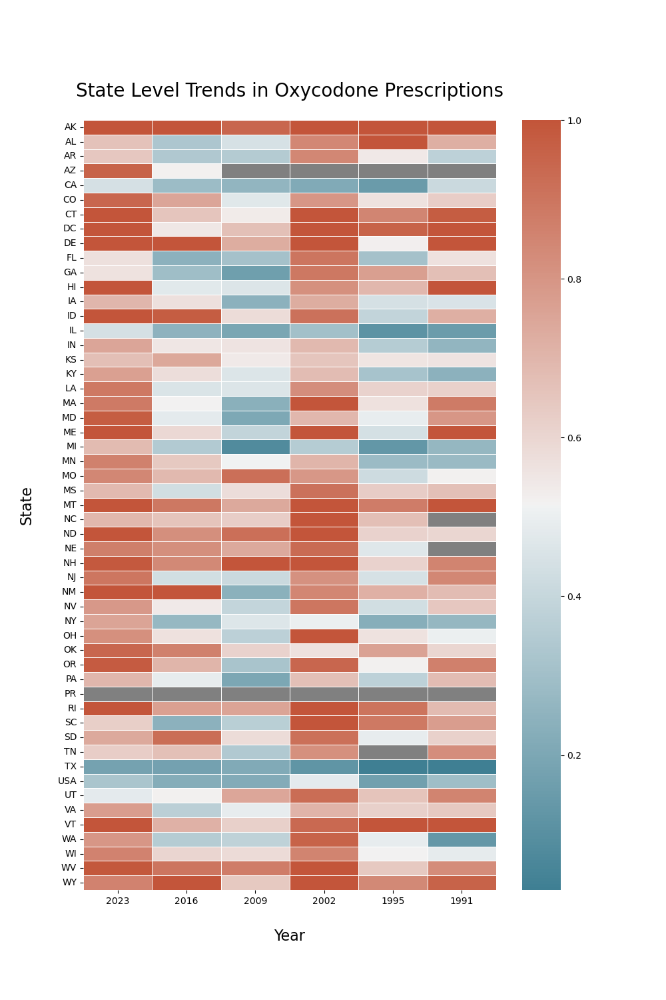

In [20]:
oxy_norm = oxy_norm.fillna(0)

oxy_norm_log = np.log10(oxy_norm + 1)

mask = oxy_norm == 0

# Set custom color palette
cmap = sns.diverging_palette(220, 20, as_cmap=True)
cmap.set_bad('grey', 1.0) 

plt.figure(figsize=(10, 15))
sns.heatmap(oxy_norm_log, cmap=cmap, mask=mask, fmt=".1f", linewidths=.5, vmax=1)

plt.title('State Level Trends in Oxycodone Prescriptions',fontsize=20, pad=25)
plt.xlabel('Year',fontsize=16, labelpad=25)
plt.ylabel('State',fontsize=16, labelpad=25)
plt.yticks(rotation=0)
plt.xticks(rotation=0)
plt.show();

#### Hydrocodone

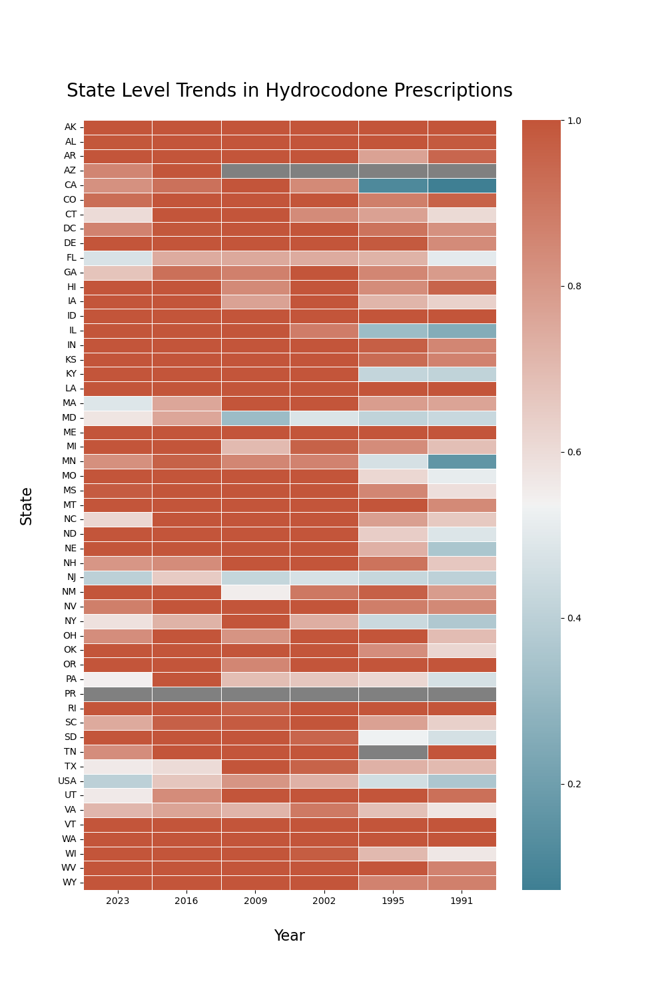

In [21]:
hydro_norm = hydro_norm.fillna(0)

hydro_norm_log = np.log10(hydro_norm + 1)

mask = hydro_norm == 0

# Set custom color palette
cmap = sns.diverging_palette(220, 20, as_cmap=True)
cmap.set_bad('grey', 1.0) 

plt.figure(figsize=(10, 15))
sns.heatmap(hydro_norm_log, cmap=cmap, mask=mask, fmt=".1f", linewidths=.5, vmax=1)

plt.title('State Level Trends in Hydrocodone Prescriptions',fontsize=20, pad=25)
plt.xlabel('Year',fontsize=16, labelpad=25)
plt.ylabel('State',fontsize=16, labelpad=25)
plt.yticks(rotation=0)
plt.xticks(rotation=0)
plt.savefig('output/State Hydro Pres.png')
plt.show();

#### Fentanyl

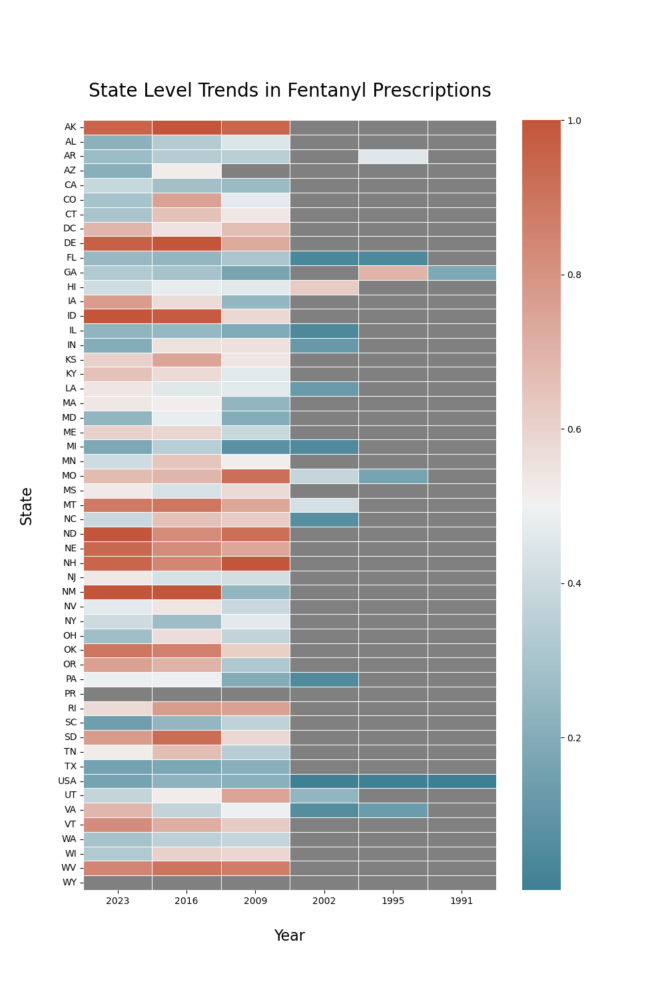

In [22]:
fenta_norm = fenta_norm.fillna(0)

fenta_norm_log = np.log10(fenta_norm + 1)

mask = fenta_norm == 0

# Set custom color palette
cmap = sns.diverging_palette(220, 20, as_cmap=True)
cmap.set_bad('grey', 1.0) 

plt.figure(figsize=(10, 15))
sns.heatmap(fenta_norm_log, cmap=cmap, mask=mask, fmt=".1f", linewidths=.5, vmax=1)

plt.title('State Level Trends in Fentanyl Prescriptions',fontsize=20, pad=25)
plt.xlabel('Year',fontsize=16, labelpad=25)
plt.ylabel('State',fontsize=16, labelpad=25)
plt.yticks(rotation=0)
plt.xticks(rotation=0)
plt.show();

#### Morphine

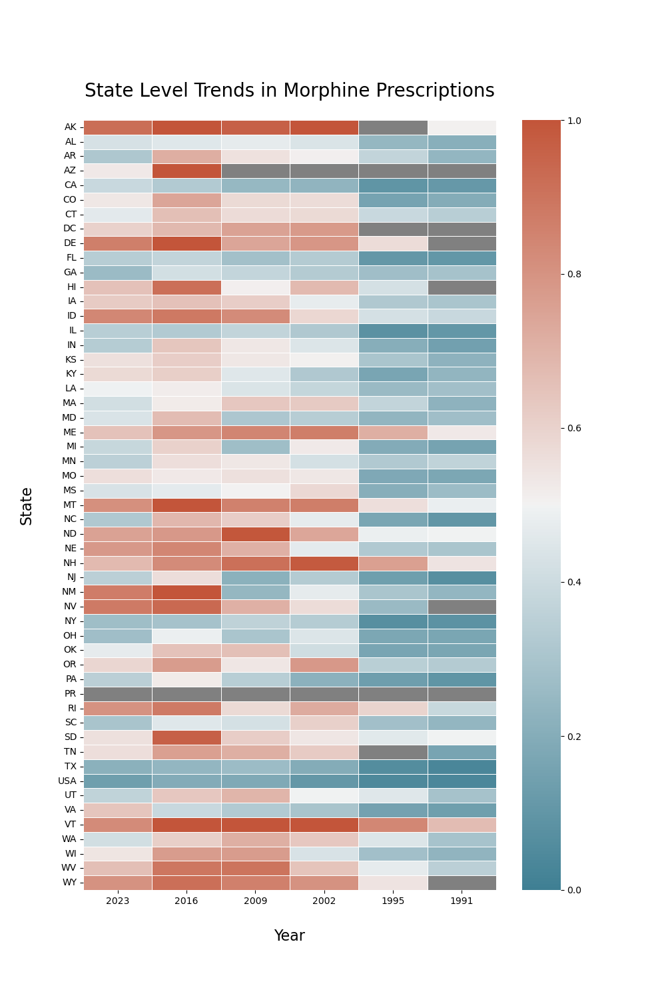

In [23]:
morph_norm = morph_norm.fillna(0)

morph_norm_log = np.log10(morph_norm + 1)

mask = morph_norm == 0

# Set custom color palette
cmap = sns.diverging_palette(220, 20, as_cmap=True)
cmap.set_bad('grey', 1.0) 

plt.figure(figsize=(10, 15))
sns.heatmap(morph_norm_log, cmap=cmap, mask=mask, fmt=".1f", linewidths=.5,vmin=0, vmax=1)

plt.title('State Level Trends in Morphine Prescriptions',fontsize=20, pad=25)
plt.xlabel('Year',fontsize=16, labelpad=25)
plt.ylabel('State',fontsize=16, labelpad=25)
plt.yticks(rotation=0)
plt.xticks(rotation=0)
plt.show();

### Line Plots

#### Clean DataFrame and Series

In [24]:
cl_oxy_norm = oxy_norm.drop('USA', axis=0)
cln_oxy_norm = cl_oxy_norm.sum()

cl_hydro_norm = hydro_norm.drop('USA', axis=0)
cln_hydro_norm = cl_hydro_norm.sum()

cl_morph_norm = morph_norm.drop('USA', axis=0)
cln_morph_norm = cl_morph_norm.sum()

cl_fenta_norm = fenta_norm.drop('USA', axis=0)
cln_fenta_norm = cl_fenta_norm.sum()

In [25]:
USA_sum_norm = cln_oxy_norm.to_frame().rename(columns={0: 'Oxycodone'})
USA_sum_norm['Hydrocodone'] = cln_hydro_norm
USA_sum_norm['Morphine'] = cln_morph_norm
USA_sum_norm['Fentanyl'] = cln_fenta_norm
USA_sum_norm

,Oxycodone,Hydrocodone,Morphine,Fentanyl
2023,363.196103,498.760147,143.733613,165.059567
2016,191.886495,765.837542,233.956992,180.088866
2009,131.739361,681.858242,168.236910,128.345601
2002,407.045152,695.610077,149.464370,8.371547
1995,163.697443,317.780884,61.601893,6.773232
1991,266.709014,273.423982,43.475748,0.515654


#### Regression Analysis

In [26]:
years_numpy = pd.to_datetime(USA_sum_norm.index).year.astype(int)

In [27]:
USA_sum_norm_numpy = USA_sum_norm.values

In [28]:
##### Oxycodone

x_axis = years_numpy
oxy_axis = USA_sum_norm_numpy[:,0]


(slope, intercept, rvalue, pvalue, stderr) = linregress(x_axis, oxy_axis)
regress_values = x_axis * slope + intercept
line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))

r_oxy = rvalue**2

print(f"R-squared value: {rvalue**2:.4f}")


R-squared value: 0.0236


In [29]:
##### Hydrocodone

x_axis = years_numpy
hydro_axis = USA_sum_norm_numpy[:,1]


(slope, intercept, rvalue, pvalue, stderr) = linregress(x_axis, hydro_axis)
regress_values = x_axis * slope + intercept
line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))


r_hydro = rvalue**2

print(f"R-squared value: {rvalue**2:.4f}")

R-squared value: 0.3684


In [30]:
##### Morphine

x_axis = years_numpy
morph_axis = USA_sum_norm_numpy[:,2]


(slope, intercept, rvalue, pvalue, stderr) = linregress(x_axis, morph_axis)
regress_values = x_axis * slope + intercept
line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))


r_morph = rvalue**2

print(f"R-squared value: {rvalue**2:.4f}")

R-squared value: 0.5959


In [31]:
##### Fentanyl

x_axis = years_numpy
fenta_axis = USA_sum_norm_numpy[:,3]


(slope, intercept, rvalue, pvalue, stderr) = linregress(x_axis, fenta_axis)
regress_values = x_axis * slope + intercept
line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))


r_fenta = rvalue**2

print(f"R-squared value: {rvalue**2:.4f}")

R-squared value: 0.8598


#### Plot

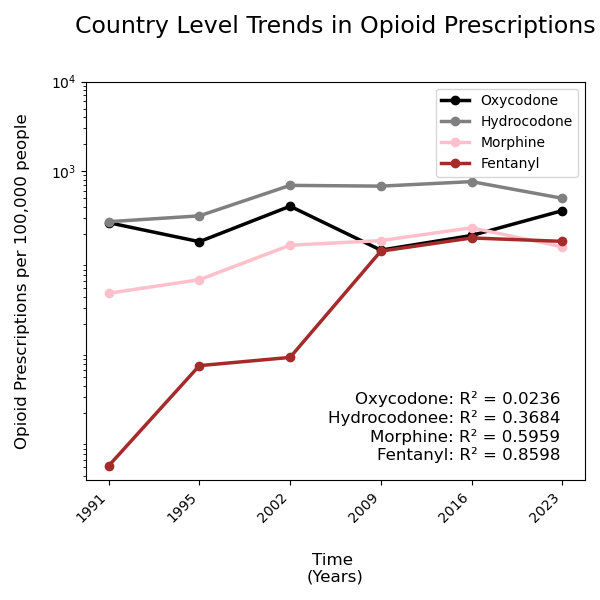

In [32]:
USA_sum_norm = cln_oxy_norm.to_frame().rename(columns={0: 'Oxycodone'})
USA_sum_norm['Hydrocodone'] = cln_hydro_norm
USA_sum_norm['Morphine'] = cln_morph_norm
USA_sum_norm['Fentanyl'] = cln_fenta_norm


USA_sum_norm = USA_sum_norm.sort_index()
years = USA_sum_norm.index


plt.figure(figsize=(6, 6))
plt.plot(USA_sum_norm.index, USA_sum_norm['Oxycodone'], color='black', label='Oxycodone', linewidth=2.5, marker='o')
plt.plot(USA_sum_norm.index, USA_sum_norm['Hydrocodone'], color='grey', label='Hydrocodone', linewidth=2.5, marker='o')
plt.plot(USA_sum_norm.index, USA_sum_norm['Morphine'], color='pink', label='Morphine', linewidth=2.5, marker='o')
plt.plot(USA_sum_norm.index, USA_sum_norm['Fentanyl'], color='brown', label='Fentanyl', linewidth=2.5, marker='o')
plt.title('Country Level Trends in Opioid Prescriptions', fontsize=17, pad=35)
plt.xlabel('Time \n(Years)', fontsize=12, labelpad=20)
plt.ylabel('Opioid Prescriptions per 100,000 people', fontsize=12, labelpad=15)
plt.yscale('log')
plt.legend(USA_sum_norm.columns) 
plt.grid(True, linestyle='--', alpha=0)
plt.xticks(years, rotation=45, ha='right')
plt.yticks([10**i for i in range(3,5)]) 

plt.text(0.95, 0.05, f'Oxycodone: R² = {r_oxy:.4f}\nHydrocodonee: R² = {r_hydro:.4f}\nMorphine: R² = {r_morph:.4f}\nFentanyl: R² = {r_fenta:.4f}', transform=plt.gca().transAxes, fontsize=12, ha='right')
plt.tight_layout()

plt.savefig('Output/Country_Level_Trends_in_Opioid_Prescriptions.png')
plt.show();

## Medicaid Reimbursement by State and Year

### Average

In [33]:
# Total Amount Reimbursed Mean 2023
oxy_2023_tmean = oxy_2023_df.groupby('State')['Total Amount Reimbursed'].mean()
hydro_2023_tmean = hydro_2023_df.groupby('State')['Total Amount Reimbursed'].mean()
morph_2023_tmean = morph_2023_df.groupby('State')['Total Amount Reimbursed'].mean()
fenta_2023_tmean = fenta_2023_df.groupby('State')['Total Amount Reimbursed'].mean()

# Medicaid Amount Reimbursed Mean 2023
oxy_2023_mmean = oxy_2023_df.groupby('State')['Medicaid Amount Reimbursed'].mean()
hydro_2023_mmean = hydro_2023_df.groupby('State')['Medicaid Amount Reimbursed'].mean()
morph_2023_mmean = morph_2023_df.groupby('State')['Medicaid Amount Reimbursed'].mean()
fenta_2023_mmean = fenta_2023_df.groupby('State')['Medicaid Amount Reimbursed'].mean()

#--------------------------------------------------------------------------------------------

# Total Amount Reimbursed Mean 2016
oxy_2016_tmean = oxy_2016_df.groupby('State')['Total Amount Reimbursed'].mean()
hydro_2016_tmean = hydro_2016_df.groupby('State')['Total Amount Reimbursed'].mean()
morph_2016_tmean = morph_2016_df.groupby('State')['Total Amount Reimbursed'].mean()
fenta_2016_tmean = fenta_2016_df.groupby('State')['Total Amount Reimbursed'].mean()

# Medicaid Amount Reimbursed Mean 2016
oxy_2016_mmean = oxy_2016_df.groupby('State')['Medicaid Amount Reimbursed'].mean()
hydro_2016_mmean = hydro_2016_df.groupby('State')['Medicaid Amount Reimbursed'].mean()
morph_2016_mmean = morph_2016_df.groupby('State')['Medicaid Amount Reimbursed'].mean()
fenta_2016_mmean = fenta_2016_df.groupby('State')['Medicaid Amount Reimbursed'].mean()

#--------------------------------------------------------------------------------------------

# Total Amount Reimbursed Mean 2009
oxy_2009_tmean = oxy_2009_df.groupby('State')['Total Amount Reimbursed'].mean()
hydro_2009_tmean = hydro_2009_df.groupby('State')['Total Amount Reimbursed'].mean()
morph_2009_tmean = morph_2009_df.groupby('State')['Total Amount Reimbursed'].mean()
fenta_2009_tmean = fenta_2009_df.groupby('State')['Total Amount Reimbursed'].mean()

# Medicaid Amount Reimbursed Mean 2009
oxy_2009_mmean = oxy_2009_df.groupby('State')['Medicaid Amount Reimbursed'].mean()
hydro_2009_mmean = hydro_2009_df.groupby('State')['Medicaid Amount Reimbursed'].mean()
morph_2009_mmean = morph_2009_df.groupby('State')['Medicaid Amount Reimbursed'].mean()
fenta_2009_mmean = fenta_2009_df.groupby('State')['Medicaid Amount Reimbursed'].mean()

#--------------------------------------------------------------------------------------------

# Total Amount Reimbursed Mean 2002
oxy_2002_tmean = oxy_2002_df.groupby('State')['Total Amount Reimbursed'].mean()
hydro_2002_tmean = hydro_2002_df.groupby('State')['Total Amount Reimbursed'].mean()
morph_2002_tmean = morph_2002_df.groupby('State')['Total Amount Reimbursed'].mean()
fenta_2002_tmean = fenta_2002_df.groupby('State')['Total Amount Reimbursed'].mean()

# Medicaid Amount Reimbursed Mean 2002
oxy_2002_mmean = oxy_2002_df.groupby('State')['Medicaid Amount Reimbursed'].mean()
hydro_2002_mmean = hydro_2002_df.groupby('State')['Medicaid Amount Reimbursed'].mean()
morph_2002_mmean = morph_2002_df.groupby('State')['Medicaid Amount Reimbursed'].mean()
fenta_2002_mmean = fenta_2002_df.groupby('State')['Medicaid Amount Reimbursed'].mean()

#--------------------------------------------------------------------------------------------

# Total Amount Reimbursed Mean 1995
oxy_1995_tmean = oxy_1995_df.groupby('State')['Total Amount Reimbursed'].mean()
hydro_1995_tmean = hydro_1995_df.groupby('State')['Total Amount Reimbursed'].mean()
morph_1995_tmean = morph_1995_df.groupby('State')['Total Amount Reimbursed'].mean()
fenta_1995_tmean = fenta_1995_df.groupby('State')['Total Amount Reimbursed'].mean()

# Medicaid Amount Reimbursed Mean 2002
oxy_1995_mmean = oxy_1995_df.groupby('State')['Medicaid Amount Reimbursed'].mean()
hydro_1995_mmean = hydro_1995_df.groupby('State')['Medicaid Amount Reimbursed'].mean()
morph_1995_mmean = morph_1995_df.groupby('State')['Medicaid Amount Reimbursed'].mean()
fenta_1995_mmean = fenta_1995_df.groupby('State')['Medicaid Amount Reimbursed'].mean()

#--------------------------------------------------------------------------------------------

# Total Amount Reimbursed Mean 1991
oxy_1991_tmean = oxy_1991_df.groupby('State')['Total Amount Reimbursed'].mean()
hydro_1991_tmean = hydro_1991_df.groupby('State')['Total Amount Reimbursed'].mean()
morph_1991_tmean = morph_1991_df.groupby('State')['Total Amount Reimbursed'].mean()
fenta_1991_tmean = fenta_1991_df.groupby('State')['Total Amount Reimbursed'].mean()

# Medicaid Amount Reimbursed Mean 1991
oxy_1991_mmean = oxy_1991_df.groupby('State')['Medicaid Amount Reimbursed'].mean()
hydro_1991_mmean = hydro_1991_df.groupby('State')['Medicaid Amount Reimbursed'].mean()
morph_1991_mmean = morph_1991_df.groupby('State')['Medicaid Amount Reimbursed'].mean()
fenta_1991_mmean = fenta_1991_df.groupby('State')['Medicaid Amount Reimbursed'].mean()

## Normalize Per State Capita

### Clean DataFrames

In [34]:
#All# Total Amount Reimbursed Mean OXYCODONE
all_oxy_tmean = oxy_2023_tmean.to_frame().rename(columns={'Total Amount Reimbursed': '2023'})
all_oxy_tmean['2016'] = oxy_2016_tmean
all_oxy_tmean['2009'] = oxy_2009_tmean
all_oxy_tmean['2002'] = oxy_2002_tmean
all_oxy_tmean['1995'] = oxy_1995_tmean
all_oxy_tmean['1991'] = oxy_1991_tmean

all_oxy_tmean = all_oxy_tmean.rename(index={'XX': 'USA'})

#Medicaid Amount Reimbursed Mean OXYCODONE
all_oxy_mmean = oxy_2023_mmean.to_frame().rename(columns={'Medicaid Amount Reimbursed': '2023'})
all_oxy_mmean['2016'] = oxy_2016_mmean
all_oxy_mmean['2009'] = oxy_2009_mmean
all_oxy_mmean['2002'] = oxy_2002_mmean
all_oxy_mmean['1995'] = oxy_1995_mmean
all_oxy_mmean['1991'] = oxy_1991_mmean

all_oxy_mmean = all_oxy_mmean.rename(index={'XX': 'USA'})
#-----------------------------------------------------------------------------------

#All# Total Amount Reimbursed Mean Hydrocodone
all_hydro_tmean = hydro_2023_tmean.to_frame().rename(columns={'Total Amount Reimbursed': '2023'})
all_hydro_tmean['2016'] = hydro_2016_tmean
all_hydro_tmean['2009'] = hydro_2009_tmean
all_hydro_tmean['2002'] = hydro_2002_tmean
all_hydro_tmean['1995'] = hydro_1995_tmean
all_hydro_tmean['1991'] = hydro_1991_tmean

all_hydro_tmean = all_hydro_tmean.rename(index={'XX': 'USA'})

#Medicaid Amount Reimbursed Mean Hydrocodone
all_hydro_mmean = hydro_2023_mmean.to_frame().rename(columns={'Medicaid Amount Reimbursed': '2023'})
all_hydro_mmean['2016'] = hydro_2016_mmean
all_hydro_mmean['2009'] = hydro_2009_mmean
all_hydro_mmean['2002'] = hydro_2002_mmean
all_hydro_mmean['1995'] = hydro_1995_mmean
all_hydro_mmean['1991'] = hydro_1991_mmean

all_hydro_mmean = all_hydro_mmean.rename(index={'XX': 'USA'})

#----------------------------------------------------------------------------------------------------
#All# Total Amount Reimbursed Mean Morphine
all_morph_tmean = morph_2023_tmean.to_frame().rename(columns={'Total Amount Reimbursed': '2023'})
all_morph_tmean['2016'] = morph_2016_tmean
all_morph_tmean['2009'] = morph_2009_tmean
all_morph_tmean['2002'] = morph_2002_tmean
all_morph_tmean['1995'] = morph_1995_tmean
all_morph_tmean['1991'] = morph_1991_tmean

all_morph_tmean = all_morph_tmean.rename(index={'XX': 'USA'})

#Medicaid Amount Reimbursed Mean Morphine
all_morph_mmean = morph_2023_mmean.to_frame().rename(columns={'Medicaid Amount Reimbursed': '2023'})
all_morph_mmean['2016'] = morph_2016_mmean
all_morph_mmean['2009'] = morph_2009_mmean
all_morph_mmean['2002'] = morph_2002_mmean
all_morph_mmean['1995'] = morph_1995_mmean
all_morph_mmean['1991'] = morph_1991_mmean

all_morph_mmean = all_morph_mmean.rename(index={'XX': 'USA'})

#----------------------------------------------------------------------------------------------------
#All# Total Amount Reimbursed Mean Fentanyl
all_fenta_tmean = fenta_2023_tmean.to_frame().rename(columns={'Total Amount Reimbursed': '2023'})
all_fenta_tmean['2016'] = fenta_2016_tmean
all_fenta_tmean['2009'] = fenta_2009_tmean
all_fenta_tmean['2002'] = fenta_2002_tmean
all_fenta_tmean['1995'] = fenta_1995_tmean
all_fenta_tmean['1991'] = fenta_1991_tmean

all_fenta_tmean = all_fenta_tmean.rename(index={'XX': 'USA'})

#Medicaid Amount Reimbursed Mean Fentanyl
all_fenta_mmean = fenta_2023_mmean.to_frame().rename(columns={'Medicaid Amount Reimbursed': '2023'})
all_fenta_mmean['2016'] = fenta_2016_mmean
all_fenta_mmean['2009'] = fenta_2009_mmean
all_fenta_mmean['2002'] = fenta_2002_mmean
all_fenta_mmean['1995'] = fenta_1995_mmean
all_fenta_mmean['1991'] = fenta_1991_mmean

all_fenta_mmean = all_fenta_mmean.rename(index={'XX': 'USA'})

### State Capita/100,000 People

In [35]:
#Normalization
oxy_mnorm = all_oxy_mmean/cln_pop*100000
oxy_tnorm = all_oxy_tmean/cln_pop*100000

fenta_mnorm = all_fenta_mmean/cln_pop*100000
fenta_tnorm = all_fenta_tmean/cln_pop*100000

hydro_mnorm = all_hydro_mmean/cln_pop*100000
hydro_tnorm = all_hydro_tmean/cln_pop*100000

morph_mnorm = all_morph_mmean/cln_pop*100000
morph_tnorm = all_morph_tmean/cln_pop*100000

## Line Plot

### Clean DataFrames

In [36]:
cl_oxy_mnorm = oxy_mnorm.drop('USA', axis=0)
cln_oxy_mnorm = cl_oxy_mnorm.sum()

cl_oxy_tnorm = oxy_tnorm.drop('USA', axis=0)
cln_oxy_tnorm = cl_oxy_tnorm.sum()

#---------------------------------------------------------------------------------
cl_hydro_mnorm = hydro_mnorm.drop('USA', axis=0)
cln_hydro_mnorm = cl_hydro_mnorm.sum()

cl_hydro_tnorm = hydro_tnorm.drop('USA', axis=0)
cln_hydro_tnorm = cl_hydro_tnorm.sum()
#---------------------------------------------------------------------------------
cl_morph_mnorm = morph_mnorm.drop('USA', axis=0)
cln_morph_mnorm = cl_morph_mnorm.sum()

cl_morph_tnorm = morph_tnorm.drop('USA', axis=0)
cln_morph_tnorm = cl_morph_tnorm.sum()

#---------------------------------------------------------------------------------
cl_fenta_mnorm = fenta_mnorm.drop('USA', axis=0)
cln_fenta_mnorm = cl_fenta_mnorm.sum()

cl_fenta_tnorm = fenta_tnorm.drop('USA', axis=0)
cln_fenta_tnorm = cl_fenta_tnorm.sum()

In [37]:
medicaid_tnorm = cln_oxy_tnorm.to_frame().rename(columns={0: 'Oxycodone'})
medicaid_tnorm['Hydrocodone'] = cln_hydro_tnorm
medicaid_tnorm['Morphine'] = cln_morph_tnorm
medicaid_tnorm['Fentanyl'] = cln_fenta_tnorm


medicaid_mnorm = cln_oxy_mnorm.to_frame().rename(columns={0: 'Oxycodone'})
medicaid_mnorm['Hydrocodone'] = cln_hydro_mnorm
medicaid_mnorm['Morphine'] = cln_morph_mnorm
medicaid_mnorm['Fentanyl'] = cln_fenta_mnorm
medicaid_mnorm

,Oxycodone,Hydrocodone,Morphine,Fentanyl
2023,6540.444474,6519.523690,6175.442376,15143.183255
2016,9874.677756,16225.989612,11262.732690,9811.069946
2009,33552.617700,9304.322324,12325.324150,32559.747275
2002,908.085613,1683.500002,1827.516418,0.000000
1995,80.016846,138.479347,139.026191,0.000000
1991,79.758406,55.054071,120.645436,0.000000


In [38]:
years_tnumpy = pd.to_datetime(medicaid_tnorm.index).year.astype(int)
years_tnumpy

years_mnumpy = pd.to_datetime(medicaid_mnorm.index).year.astype(int)
years_mnumpy

Index([2023, 2016, 2009, 2002, 1995, 1991], dtype='int64')

Index([2023, 2016, 2009, 2002, 1995, 1991], dtype='int64')

In [39]:
medicaid_tnorm_tnumpy = medicaid_tnorm.values
medicaid_tnorm

medicaid_mnorm_mnumpy = medicaid_mnorm.values
medicaid_mnorm

,Oxycodone,Hydrocodone,Morphine,Fentanyl
2023,6696.994406,6663.122567,6955.935912,19039.935792
2016,11290.491089,16513.122534,11859.347222,11226.665881
2009,34058.219932,9522.044126,12566.018964,33062.638072
2002,6043.585854,8369.377221,15623.491357,732.230310
1995,2037.222340,2740.823260,2556.739454,580.555149
1991,2275.125949,1566.758476,1332.309262,57.229944


,Oxycodone,Hydrocodone,Morphine,Fentanyl
2023,6540.444474,6519.523690,6175.442376,15143.183255
2016,9874.677756,16225.989612,11262.732690,9811.069946
2009,33552.617700,9304.322324,12325.324150,32559.747275
2002,908.085613,1683.500002,1827.516418,0.000000
1995,80.016846,138.479347,139.026191,0.000000
1991,79.758406,55.054071,120.645436,0.000000


### Regression Analysis

In [40]:
#### Oxycodone Total

x_taxis = years_tnumpy
oxy_taxis = medicaid_tnorm_tnumpy[:,0]


(slope, intercept, rvalue, pvalue, stderr) = linregress(x_axis, oxy_taxis)
regress_values = x_axis * slope + intercept
line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))

r_oxyt = rvalue**2

print(f"R-squared value: {rvalue**2:.4f}")

R-squared value: 0.1112


In [41]:
#### Oxycodone Medicaid

x_maxis = years_mnumpy
oxy_maxis = medicaid_mnorm_mnumpy[:,0]


(slope, intercept, rvalue, pvalue, stderr) = linregress(x_axis, oxy_maxis)
regress_values = x_axis * slope + intercept
line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))

r_oxym = rvalue**2

print(f"R-squared value: {rvalue**2:.4f}")

R-squared value: 0.1469


In [42]:
#### Hydrocodone Total

x_taxis = years_tnumpy
hydro_taxis = medicaid_tnorm_tnumpy[:,1]


(slope, intercept, rvalue, pvalue, stderr) = linregress(x_axis, hydro_taxis)
regress_values = x_axis * slope + intercept
line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))

r_hydrot = rvalue**2

print(f"R-squared value: {rvalue**2:.4f}")

R-squared value: 0.4398


In [43]:
#### Hydrocodone Medicaid

x_maxis = years_mnumpy
hydro_maxis = medicaid_mnorm_mnumpy[:,1]


(slope, intercept, rvalue, pvalue, stderr) = linregress(x_axis, hydro_maxis)
regress_values = x_axis * slope + intercept
line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))

r_hydrom = rvalue**2

print(f"R-squared value: {rvalue**2:.4f}")

R-squared value: 0.5513


In [44]:
#### Morphine Total

x_taxis = years_tnumpy
morph_taxis = medicaid_tnorm_tnumpy[:,2]


(slope, intercept, rvalue, pvalue, stderr) = linregress(x_axis, morph_taxis)
regress_values = x_axis * slope + intercept
line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))

r_morpht = rvalue**2

print(f"R-squared value: {rvalue**2:.4f}")

R-squared value: 0.2109


In [45]:
#### Morphine Medicaid

x_maxis = years_mnumpy
morph_maxis = medicaid_mnorm_mnumpy[:,2]


(slope, intercept, rvalue, pvalue, stderr) = linregress(x_axis, morph_maxis)
regress_values = x_axis * slope + intercept
line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))

r_morphm = rvalue**2

print(f"R-squared value: {rvalue**2:.4f}")

R-squared value: 0.5179


In [46]:
#### Fentanyl Total

x_taxis = years_tnumpy
fenta_taxis = medicaid_tnorm_tnumpy[:,3]


(slope, intercept, rvalue, pvalue, stderr) = linregress(x_axis, fenta_taxis)
regress_values = x_axis * slope + intercept
line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))

r_fentat = rvalue**2

print(f"R-squared value: {rvalue**2:.4f}")

R-squared value: 0.4098


In [47]:
#### Fentanyl Medicaid

In [48]:
x_maxis = years_mnumpy
fenta_maxis = medicaid_mnorm_mnumpy[:,3]


(slope, intercept, rvalue, pvalue, stderr) = linregress(x_axis, fenta_maxis)
regress_values = x_axis * slope + intercept
line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))

r_fentam = rvalue**2

print(f"R-squared value: {rvalue**2:.4f}")

R-squared value: 0.3239


### Plot (Medicaid)

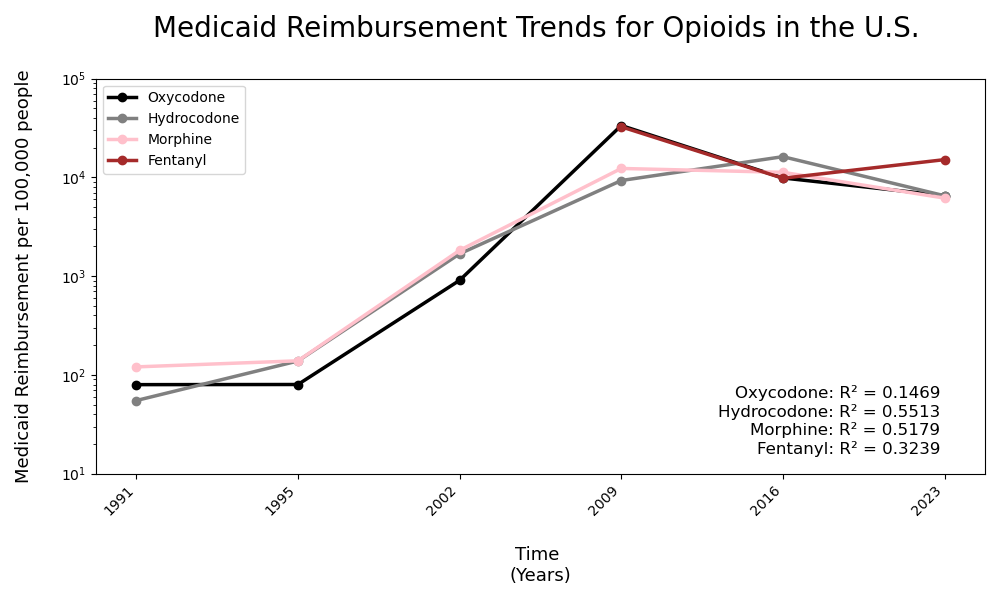

In [49]:
# Sort the DataFrame by index (years)
medicaid_mnorm = medicaid_mnorm.sort_index()

medicaid_mnorm = medicaid_mnorm[medicaid_mnorm > 0]
# Plotting
plt.figure(figsize=(10, 6))


plt.plot(medicaid_mnorm.index, medicaid_mnorm['Oxycodone'], color='black', label='Oxycodone', linewidth=2.5, marker='o')
plt.plot(medicaid_mnorm.index, medicaid_mnorm['Hydrocodone'], color='grey', label='Hydrocodone', linewidth=2.5, marker='o')
plt.plot(medicaid_mnorm.index, medicaid_mnorm['Morphine'], color='pink', label='Morphine', linewidth=2.5, marker='o')
plt.plot(medicaid_mnorm.index, medicaid_mnorm['Fentanyl'], color='brown', label='Fentanyl', linewidth=2.5, marker='o')


# Add title and labels
plt.title('Medicaid Reimbursement Trends for Opioids in the U.S. ',fontsize=20, pad=30)
plt.xlabel('Time \n(Years)', fontsize=13, labelpad=20)
plt.ylabel('Medicaid Reimbursement per 100,000 people', fontsize=13, labelpad=20)

# Set logarithmic scale for y-axis
plt.yscale('log')
# Add legend
plt.legend()

# Grid settings
plt.grid(True, linestyle='--', alpha=0.7)

# Adjust tick labels and rotation for better readability
plt.xticks(rotation=45, ha='right')  # Using default ticks based on medicaid_norm.index

# Set y-ticks for logarithmic scale
 # Adjust y-ticks as needed

plt.yticks([10**i for i in range(1,6)]) 


plt.text(0.95, 0.05, f'Oxycodone: R² = {r_oxym:.4f}\nHydrocodone: R² = {r_hydrom:.4f}\nMorphine: R² = {r_morphm:.4f}\nFentanyl: R² = {r_fentam:.4f}', transform=plt.gca().transAxes, fontsize=12, ha='right')

# Ensure the plot layout is tight
plt.tight_layout()
plt.grid(True, linestyle='--', alpha=0)


plt.savefig('Output/Medicaid Reimbursement Trends for Opioids in the U.S..png')
# Show the plot
plt.show();


### Plot (Total)

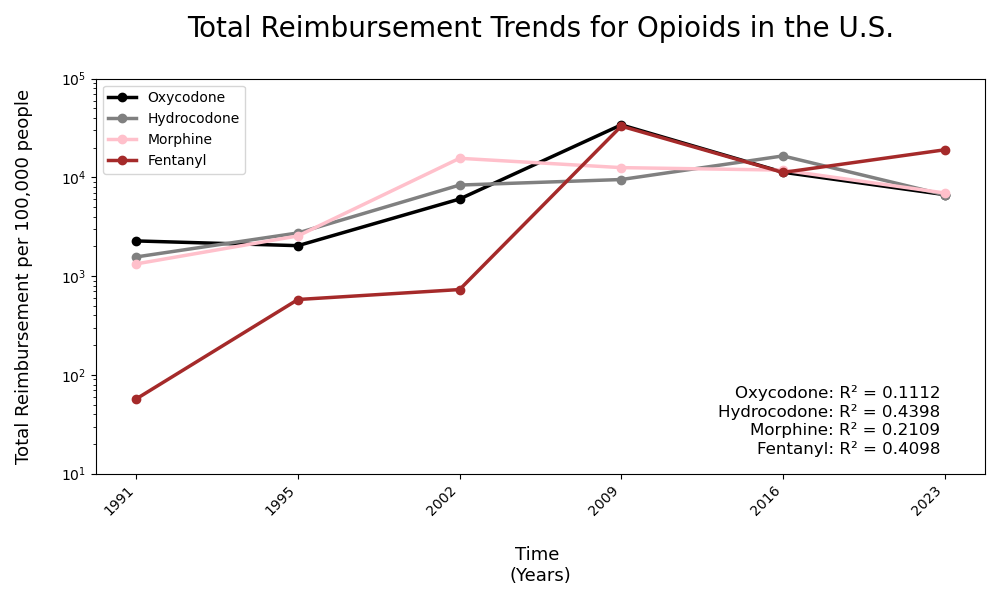

In [50]:
medicaid_tnorm = medicaid_tnorm.sort_index()

# Plotting
plt.figure(figsize=(10, 6))

# Plot each opioid type with specified colors and markers
plt.plot(medicaid_tnorm.index, medicaid_tnorm['Oxycodone'], color='black', label='Oxycodone', linewidth=2.5, marker='o')
plt.plot(medicaid_tnorm.index, medicaid_tnorm['Hydrocodone'], color='grey', label='Hydrocodone', linewidth=2.5, marker='o')
plt.plot(medicaid_tnorm.index, medicaid_tnorm['Morphine'], color='pink', label='Morphine', linewidth=2.5, marker='o')
plt.plot(medicaid_tnorm.index, medicaid_tnorm['Fentanyl'], color='brown', label='Fentanyl', linewidth=2.5, marker='o')

# Add title and labels
plt.title('Total Reimbursement Trends for Opioids in the U.S.',fontsize=20, pad=30)
plt.xlabel('Time \n(Years)', fontsize=13, labelpad=20)
plt.ylabel('Total Reimbursement per 100,000 people', fontsize=13, labelpad=20)

# Set logarithmic scale for y-axis
plt.yscale('log')
# Add legend
plt.legend()

# Grid settings
plt.grid(True, linestyle='--', alpha=0.7)

# Adjust tick labels and rotation for better readability
plt.xticks(rotation=45, ha='right')  # Using default ticks based on medicaid_norm.index

# Set y-ticks for logarithmic scale
 # Adjust y-ticks as needed

plt.yticks([10**i for i in range(1,6)]) 
# Ensure the plot layout is tight

plt.text(0.95, 0.05, f'Oxycodone: R² = {r_oxyt:.4f}\nHydrocodone: R² = {r_hydrot:.4f}\nMorphine: R² = {r_morpht:.4f}\nFentanyl: R² = {r_fentat:.4f}', transform=plt.gca().transAxes, fontsize=12, ha='right')

plt.tight_layout()
plt.grid(True, linestyle='--', alpha=0)

plt.savefig('Output/Total Reimbursement Trends for Opioids in the U.S..png')
# Show the plot
plt.show();

# Does poverty influence opioid mortality rates? (JC)

In [51]:
# create state abbreviations for heat map
state_abbreviations = {
    'Alabama': 'AL',
    'Alaska': 'AK',
    'Arizona': 'AZ',
    'Arkansas': 'AR',
    'California': 'CA',
    'Colorado': 'CO',
    'Connecticut': 'CT',
    'Delaware': 'DE',
    'District of Columbia' : 'DC',
    'Florida': 'FL',
    'Georgia': 'GA',
    'Hawaii': 'HI',
    'Idaho': 'ID',
    'Illinois': 'IL',
    'Indiana': 'IN',
    'Iowa': 'IA',
    'Kansas': 'KS',
    'Kentucky': 'KY',
    'Louisiana': 'LA',
    'Maine': 'ME',
    'Maryland': 'MD',
    'Massachusetts': 'MA',
    'Michigan': 'MI',
    'Minnesota': 'MN',
    'Mississippi': 'MS',
    'Missouri': 'MO',
    'Montana': 'MT',
    'Nebraska': 'NE',
    'Nevada': 'NV',
    'New Hampshire': 'NH',
    'New Jersey': 'NJ',
    'New Mexico': 'NM',
    'New York': 'NY',
    'North Carolina': 'NC',
    'North Dakota': 'ND',
    'Ohio': 'OH',
    'Oklahoma': 'OK',
    'Oregon': 'OR',
    'Pennsylvania': 'PA',
    'Rhode Island': 'RI',
    'South Carolina': 'SC',
    'South Dakota': 'SD',
    'Tennessee': 'TN',
    'Texas': 'TX',
    'Utah': 'UT',
    'Vermont': 'VT',
    'Virginia': 'VA',
    'Washington': 'WA',
    'West Virginia': 'WV',
    'Wisconsin': 'WI',
    'Wyoming': 'WY'
}

In [52]:
# Add abbreviation column to DataFrame
df['Abbreviation'] = df['state_National'].map(state_abbreviations)

## Choropleth Map

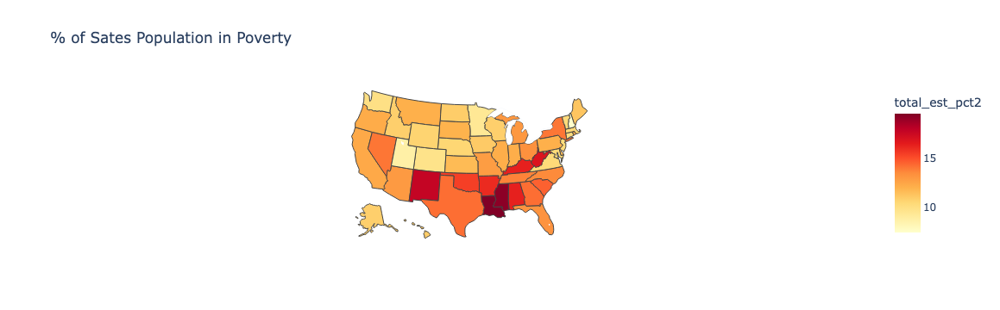

In [53]:
# Create the choropleth map
fig = px.choropleth(df,
                    locations='Abbreviation',
                    locationmode="USA-states",
                    color='total_est_pct2',
                    scope="usa",
                    color_continuous_scale="YlOrRd",  # or any other color scale
                    title=" % of Sates Population in Poverty")

# Show the figure
fig.show()

## Plot: Top 10 States with the Highest Percent of People Living in Poverty

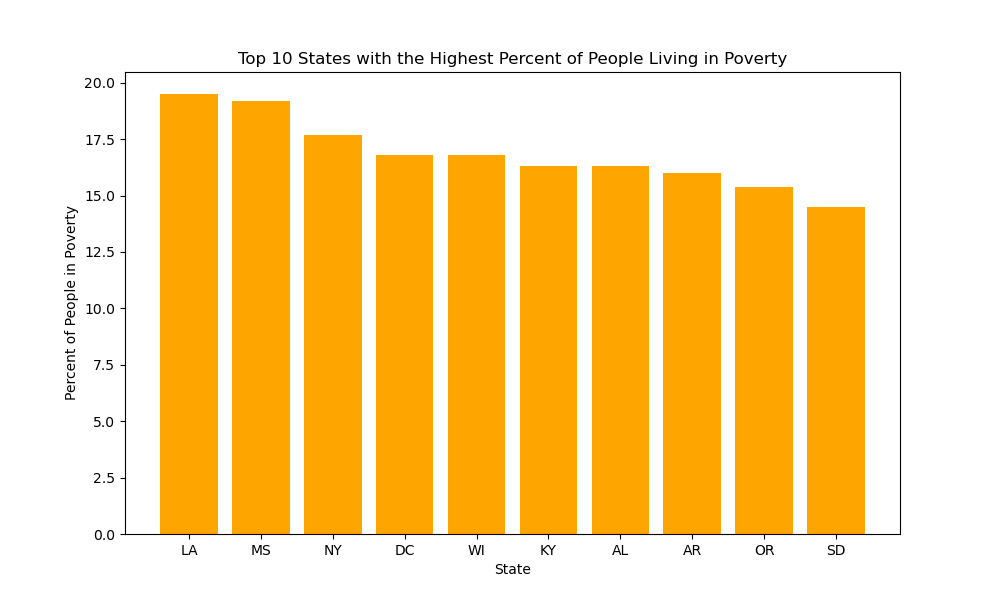

In [54]:
# Create a DataFrame from the provided data to display the top 10 states with highest poverty percentage
data = {
    'state_National': ['Alabama', 'Alaska', 'Arizona', 'Arkansas', 'California', 'Colorado', 'Connecticut', 'Delaware', 
                       'District of Columbia', 'Florida', 'Georgia', 'Hawaii', 'Idaho', 'Illinois', 'Indiana', 'Iowa', 
                       'Kansas', 'Kentucky', 'Louisiana', 'Maine', 'Maryland', 'Massachusetts', 'Michigan', 'Minnesota', 
                       'Mississippi', 'Missouri', 'Montana', 'National', 'Nebraska', 'Nevada', 'New Hampshire', 
                       'New Jersey', 'New Mexico', 'New York', 'North Carolina', 'North Dakota', 'Ohio', 'Oklahoma', 
                       'Oregon', 'Pennsylvania', 'Rhode Island', 'South Carolina', 'South Dakota', 'Tennessee', 'Texas', 
                       'Utah', 'Vermont', 'Virginia', 'Washington', 'West Virginia', 'Wisconsin'],
    'total_est_pct2': [16.3, 10.8, 12.9, 16.0, 12.3, 9.7, 10.1, 11.5, 16.8, 13.2, 14.2, 10.9, 10.8, 12.1, 12.1, 11.0, 
                       11.6, 16.3, 19.5, 11.2, 10.3, 10.4, 13.0, 9.3, 19.2, 12.8, 12.0, 12.8, 10.5, 14.0, 7.4, 10.2, 17.7, 
                       14.0, 13.5, 10.9, 13.3, 15.4, 12.2, 12.0, 12.1, 14.5, 11.9, 13.7, 14.2, 8.7, 10.2, 10.3, 9.9, 16.8, 
                       10.8],
    'Abbreviation': ['AL', 'AK', 'AZ', 'AR', 'CA', 'CO', 'CT', 'DE', 'DC', 'FL', 'GA', 'HI', 'ID', 'IL', 'IN', 'IA', 
                     'KS', 'KY', 'LA', 'ME', 'MD', 'MA', 'MI', 'MN', 'MS', 'MO', 'MT', 'NE', 'NV', 'NH', 'NJ', 'NM', 
                     'NY', 'NC', 'ND', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX', 'UT', 'VT', 'VA', 'WA', 
                     'WV', 'WI', 'WY']
}

df4 = pd.DataFrame(data)

# Sort the DataFrame based on the total_est_pct2 column in descending order and select the top 5 states
top_5_states = df4.sort_values(by='total_est_pct2', ascending=False).head(10)

# Plot the bar chart
plt.figure(figsize=(10, 6))
plt.bar(top_5_states['Abbreviation'], top_5_states['total_est_pct2'], color='orange')
plt.xlabel('State')
plt.ylabel('Percent of People in Poverty')
plt.title('Top 10 States with the Highest Percent of People Living in Poverty')
plt.savefig('output/poverty_graph.png')
plt.show();

In [55]:
#create df for states population
pop_by_state_df2 = pd.DataFrame(pop_by_state_df[["ST","2014"]])
pop_by_state_df2["2014"] = pop_by_state_df2["2014"] / 100000
pop_by_state_df2["2014"] = pop_by_state_df2["2014"].round(2)
pop_by_state_df2 = pop_by_state_df2.rename(columns={"ST":"Abbreviation",
                                                    "2014":"Population"})
pop_by_state_df2.head()

,Abbreviation,Population
0,AL,48.32
1,AK,7.38
2,AZ,66.35
3,AR,29.60
4,CA,382.54


In [56]:
# add abbreviation column for heat map of united states
df2['Abbreviation'] = df2['State'].map(state_abbreviations)

In [57]:
# add abbreviation column and read into only neccessary columns and rows
df3 = df2.loc[(df2["Year"] == 2014), ["State", "Deaths", "Abbreviation"]]
df3 = pd.merge(df3, pop_by_state_df2, how="inner", on="Abbreviation")
df3 = df3[["State", "Abbreviation", "Deaths", "Population"]]
df3["Deaths"] = df3["Deaths"].astype(int)
df3["Deaths per 100k"] = df3["Deaths"].div(df3["Population"].values,axis=0)
df3["Deaths per 100k"] = df3["Deaths per 100k"].round(3)
df3.head()

,State,Abbreviation,Deaths,Population,Deaths per 100k
0,Alabama,AL,282,48.32,5.836
1,Alaska,AK,79,7.38,10.705
2,Arizona,AZ,616,66.35,9.284
3,Arkansas,AR,179,29.60,6.047
4,California,CA,2159,382.54,5.644


## Plot: Top 10 States with the Highest Number of Opioid Related Deaths

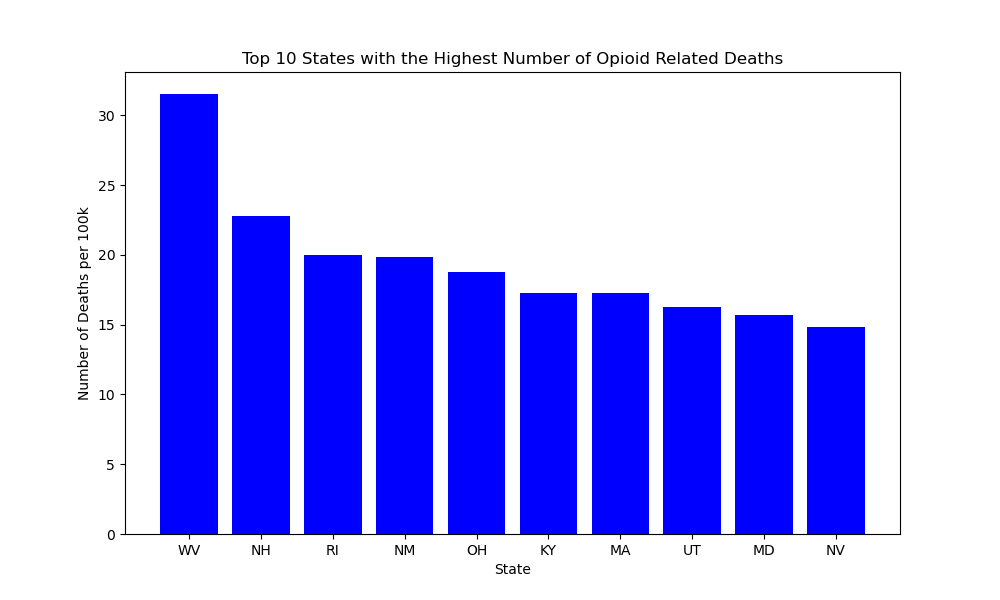

In [58]:
data = {
    'State': ['Alabama', 'Alaska', 'Arizona', 'Arkansas', 'California', 'Colorado', 'Connecticut', 'Delaware', 
              'District of Columbia', 'Florida', 'Georgia', 'Hawaii', 'Idaho', 'Illinois', 'Indiana', 'Iowa', 
              'Kansas', 'Kentucky', 'Louisiana', 'Maine', 'Maryland', 'Massachusetts', 'Michigan', 'Minnesota', 
              'Mississippi', 'Missouri', 'Montana', 'Nebraska', 'Nevada', 'New Hampshire', 'New Jersey', 
              'New Mexico', 'New York', 'North Carolina', 'North Dakota', 'Ohio', 'Oklahoma', 'Oregon', 
              'Pennsylvania', 'Rhode Island', 'South Carolina', 'South Dakota', 'Tennessee', 'Texas', 'Utah', 
              'Vermont', 'Virginia', 'Washington', 'West Virginia', 'Wisconsin', 'Wyoming'],
    'Year': [2014] * 51,
    'Deaths': df3["Deaths per 100k"],
    'Abbreviation': ['AL', 'AK', 'AZ', 'AR', 'CA', 'CO', 'CT', 'DE', 'DC', 'FL', 'GA', 'HI', 'ID', 'IL', 'IN', 'IA', 
                     'KS', 'KY', 'LA', 'ME', 'MD', 'MA', 'MI', 'MN', 'MS', 'MO', 'MT', 'NE', 'NV', 'NH', 'NJ', 'NM', 
                     'NY', 'NC', 'ND', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX', 'UT', 'VT', 'VA', 'WA', 
                     'WV', 'WI', 'WY']
}

df = pd.DataFrame(data)

# Sort the DataFrame based on the Deaths column in descending order and select the top 5 states
top_5_states = df.sort_values(by='Deaths', ascending=False).head(10)

# Plot the bar chart
plt.figure(figsize=(10, 6))
plt.bar(top_5_states['Abbreviation'], top_5_states['Deaths'], color='blue')
plt.xlabel('State')
plt.ylabel('Number of Deaths per 100k')
plt.title('Top 10 States with the Highest Number of Opioid Related Deaths')
plt.savefig('output/opiod_deathsV2.png')
plt.show();

## Plot: States Population Poverty % Vs. Opioid-Related Deaths per 100k by State

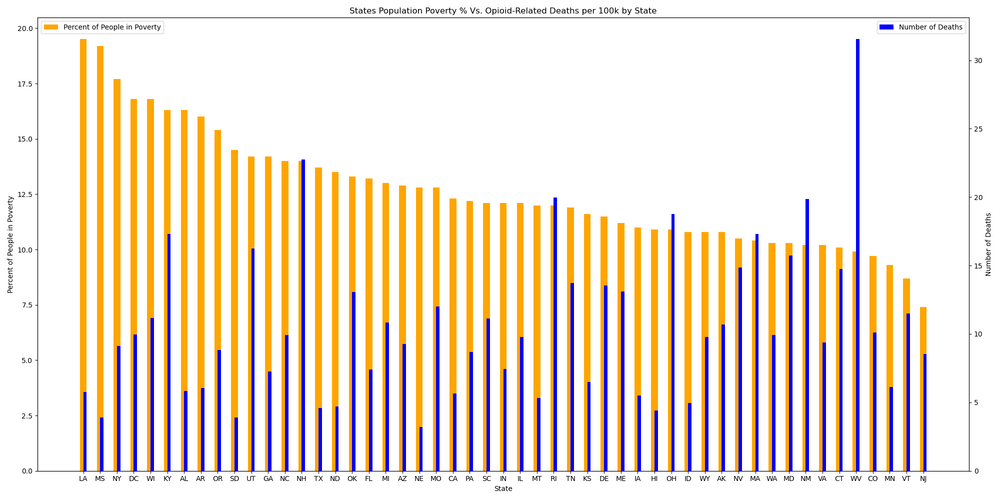

In [59]:
# Data for the first bar graph
data_poverty = {
    'state_National': ['Alabama', 'Alaska', 'Arizona', 'Arkansas', 'California', 'Colorado', 'Connecticut', 'Delaware',
                       'District of Columbia', 'Florida', 'Georgia', 'Hawaii', 'Idaho', 'Illinois', 'Indiana', 'Iowa',
                       'Kansas', 'Kentucky', 'Louisiana', 'Maine', 'Maryland', 'Massachusetts', 'Michigan', 'Minnesota',
                       'Mississippi', 'Missouri', 'Montana', 'National', 'Nebraska', 'Nevada', 'New Hampshire',
                       'New Jersey', 'New Mexico', 'New York', 'North Carolina', 'North Dakota', 'Ohio', 'Oklahoma',
                       'Oregon', 'Pennsylvania', 'Rhode Island', 'South Carolina', 'South Dakota', 'Tennessee', 'Texas',
                       'Utah', 'Vermont', 'Virginia', 'Washington', 'West Virginia', 'Wisconsin'],
    'total_est_pct2': [16.3, 10.8, 12.9, 16.0, 12.3, 9.7, 10.1, 11.5, 16.8, 13.2, 14.2, 10.9, 10.8, 12.1, 12.1, 11.0,
                       11.6, 16.3, 19.5, 11.2, 10.3, 10.4, 13.0, 9.3, 19.2, 12.8, 12.0, 12.8, 10.5, 14.0, 7.4, 10.2, 17.7,
                       14.0, 13.5, 10.9, 13.3, 15.4, 12.2, 12.0, 12.1, 14.5, 11.9, 13.7, 14.2, 8.7, 10.2, 10.3, 9.9, 16.8,
                       10.8],
    'Abbreviation': ['AL', 'AK', 'AZ', 'AR', 'CA', 'CO', 'CT', 'DE', 'DC', 'FL', 'GA', 'HI', 'ID', 'IL', 'IN', 'IA',
                     'KS', 'KY', 'LA', 'ME', 'MD', 'MA', 'MI', 'MN', 'MS', 'MO', 'MT', 'NE', 'NV', 'NH', 'NJ', 'NM',
                     'NY', 'NC', 'ND', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX', 'UT', 'VT', 'VA', 'WA',
                     'WV', 'WI', 'WY']
}
# Data for the second bar graph
data_deaths = {
    'State': ['Alabama', 'Alaska', 'Arizona', 'Arkansas', 'California', 'Colorado', 'Connecticut', 'Delaware',
              'District of Columbia', 'Florida', 'Georgia', 'Hawaii', 'Idaho', 'Illinois', 'Indiana', 'Iowa',
              'Kansas', 'Kentucky', 'Louisiana', 'Maine', 'Maryland', 'Massachusetts', 'Michigan', 'Minnesota',
              'Mississippi', 'Missouri', 'Montana', 'Nebraska', 'Nevada', 'New Hampshire', 'New Jersey',
              'New Mexico', 'New York', 'North Carolina', 'North Dakota', 'Ohio', 'Oklahoma', 'Oregon',
              'Pennsylvania', 'Rhode Island', 'South Carolina', 'South Dakota', 'Tennessee', 'Texas', 'Utah',
              'Vermont', 'Virginia', 'Washington', 'West Virginia', 'Wisconsin', 'Wyoming'],
    'Year': [2014] * 51,
    'Deaths': df3["Deaths per 100k"],
    'Abbreviation': ['AL', 'AK', 'AZ', 'AR', 'CA', 'CO', 'CT', 'DE', 'DC', 'FL', 'GA', 'HI', 'ID', 'IL', 'IN', 'IA',
                     'KS', 'KY', 'LA', 'ME', 'MD', 'MA', 'MI', 'MN', 'MS', 'MO', 'MT', 'NE', 'NV', 'NH', 'NJ', 'NM',
                     'NY', 'NC', 'ND', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX', 'UT', 'VT', 'VA', 'WA',
                     'WV', 'WI', 'WY']
}
df_poverty = pd.DataFrame(data_poverty)
df_deaths = pd.DataFrame(data_deaths)
# Merge the two DataFrames on the Abbreviation column
merged_df = pd.merge(df_poverty, df_deaths[['Abbreviation', 'Deaths']], on='Abbreviation')
merged_df = merged_df.sort_values("total_est_pct2", ascending=False)

# Plot the combined bar chart
fig, ax1 = plt.subplots(figsize=(20, 10))
# Plot the percent of people in poverty
ax1.bar(merged_df['Abbreviation'], merged_df['total_est_pct2'], color='orange', width=0.4, align='center', label='Percent of People in Poverty')
ax1.set_xlabel('State')
ax1.set_ylabel('Percent of People in Poverty', color='Black')
ax1.tick_params(axis='y', labelcolor='Black')
ax1.set_title('States Population Poverty % Vs. Opioid-Related Deaths per 100k by State')
# Create another y-axis to plot the number of deaths
ax2 = ax1.twinx()
ax2.bar(merged_df['Abbreviation'], merged_df['Deaths'], color='blue', width=0.2, align='edge', label='Number of Deaths')
ax2.set_ylabel('Number of Deaths', color='black')
ax2.tick_params(axis='y', labelcolor='Black')
# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')
# Adjust the layout to make room for the rotated x-axis labels
plt.tight_layout()
# Add legends
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
plt.savefig('output/poverty_vs_deaths.png')
plt.show();

# What demographics are susceptible to higher rates of opioid mortality? (ADC)

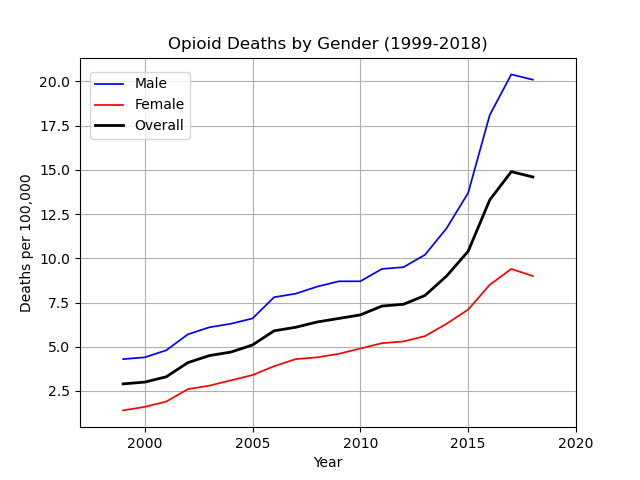

In [60]:
##Filter core data to be analyzed (i.e. only opioid deaths, deaths per 100k - age-adjusted)
all_df = data_df[data_df["PANEL"] == "Drug overdose deaths involving any opioid"]
all_df = all_df[all_df["UNIT"] == "Deaths per 100,000 resident population, age-adjusted"]

male_df = all_df[all_df["STUB_LABEL"] == "Male"]
female_df = all_df[all_df["STUB_LABEL"] == "Female"]
all_df = all_df[all_df["STUB_LABEL"] == "All persons"]

# Generate a line plot of Deaths per 100k vs. calendar year
##Define data to be analyzed from DF (One set each for all, male, female)
Year_all = all_df.loc[:,"YEAR"]

Deaths_all = all_df.loc[:,"ESTIMATE"]
Deaths_male = male_df.loc[:,"ESTIMATE"]
Deaths_female = female_df.loc[:,"ESTIMATE"]

##Set parameters and variables to be plotted on a line chart with output
fig, ax1 = plt.subplots()
plt.title("Opioid Deaths by Gender (1999-2018)", fontsize=12)
ax1.set_xlim(min(Year_all)-2, max(Year_all)+2)
ax1.set_ylabel("Deaths per 100,000")
ax1.set_xlabel("Year")
plt.grid(True)

#set line plots
all,    = plt.plot(Year_all, Deaths_all, linewidth=2.0, marker="", color="black", label="Overall")
male,   = plt.plot(Year_all, Deaths_male, linewidth=1.25, marker="", color="blue", label="Male")
female, = plt.plot(Year_all, Deaths_female, linewidth=1.25, marker="", color="red", label="Female")

#set legend, save to file and output to screen
plt.legend(handles=[male,
                    female,
                    all], loc=(0.02,.78))
plt.savefig("output/rate_by_gender.png")
plt.show();

In [61]:
#Summarize Opioid Deaths by gender chart in previous code block
gender_df = data_df.copy()

#Set parameters to be included
gender_df = gender_df[gender_df["UNIT"] == "Deaths per 100,000 resident population, age-adjusted"]
gender_df = gender_df[gender_df["PANEL"] == "Drug overdose deaths involving any opioid"]
gender_df = gender_df[gender_df["STUB_NAME"].isin(["Total","Sex"])]
gender_df = gender_df[gender_df["YEAR"].isin([1999,2004,2009,2014,2018])]

#Finalize DF
gender_df["YEAR"]= gender_df["YEAR"].astype(str)
gender_df = pd.DataFrame(gender_df[["YEAR","STUB_LABEL","ESTIMATE"]])
gender_df = gender_df.rename(columns = {"YEAR":"Year",
                                        "STUB_LABEL":"Gender",
                                        "ESTIMATE":"Deaths per 100k"})

#Call values for 2018 death rates for ratio calculation
male_2018 = gender_df[gender_df["Year"] == "2018"]
male_2018 = male_2018[male_2018["Gender"] == "Male"]
male_2018 = male_2018.values[0,2]

female_2018 = gender_df[gender_df["Year"] == "2018"]
female_2018 = female_2018[female_2018["Gender"] == "Female"].round(2)
female_2018 = female_2018.values[0,2]

#Calculate ratio of men to women overdose death rates
calc_2018 = round(male_2018 / female_2018, 2)

#formating summary DF for presentation
gender_df = gender_df.groupby(["Year","Gender"])["Deaths per 100k"].sum()
gender_df = pd.DataFrame(gender_df)
gender_df = gender_df.transpose()

#Output to ratio & DF to screen
print(f"By 2018, the ratio of opioid overdose death rates for men to opioid overdose death rates for women was {calc_2018}.")
print("")
gender_df

By 2018, the ratio of opioid overdose death rates for men to opioid overdose death rates for women was 2.23.



Year                   1999                    2004                    2009  \
Gender          All persons Female Male All persons Female Male All persons   
Deaths per 100k         2.9    1.4  4.3         4.7    3.1  6.3         6.6   

Year                               2014                     2018               
Gender          Female Male All persons Female  Male All persons Female  Male  
Deaths per 100k    4.6  8.7         9.0    6.3  11.7        14.6    9.0  20.1

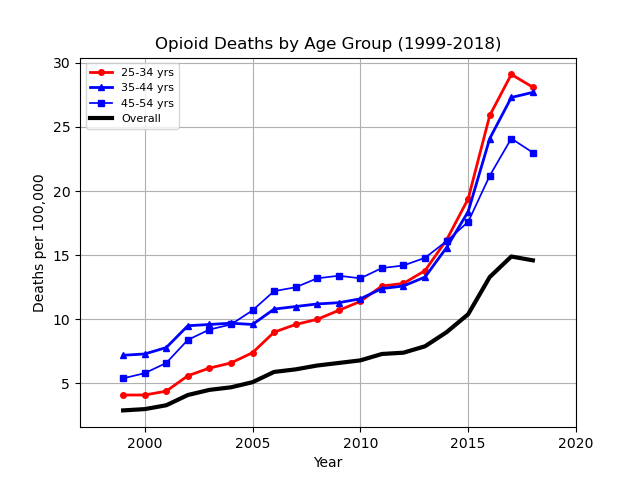

In [62]:
##Create deaths by age grouping chart
##Filter core data to be analyzed (i.e. only opioid deaths, deaths per 100k - age-adjusted)
age_df = data_df[data_df["PANEL"] == "Drug overdose deaths involving any opioid"]
age_df = age_df[age_df["STUB_NAME"] == "Age"]

##Separate each age group into separate DFs
under_15_df     = age_df[age_df["STUB_LABEL"] == "Under 15 years"]
age_15_24_df    = age_df[age_df["STUB_LABEL"] == "15-24 years"]
age_25_34_df    = age_df[age_df["STUB_LABEL"] == "25-34 years"]
age_35_44_df    = age_df[age_df["STUB_LABEL"] == "35-44 years"]
age_45_54_df    = age_df[age_df["STUB_LABEL"] == "45-54 years"]
age_55_64_df    = age_df[age_df["STUB_LABEL"] == "55-64 years"]
age_65_74_df    = age_df[age_df["STUB_LABEL"] == "65-74 years"]
age_75_84_df    = age_df[age_df["STUB_LABEL"] == "75-84 years"]
inc_n_ovr_85_df = age_df[age_df["STUB_LABEL"] == "85 years and over"]

# Generate a line plot of Deaths per 100k vs. calendar year
##Define data to be analyzed from DF (One set each for all, each age group)
Year_all = all_df.loc[:,"YEAR"]

Deaths_all      =          all_df.loc[:,"ESTIMATE"]
Deaths_und15    =     under_15_df.loc[:,"ESTIMATE"]
Deaths_15_24    =    age_15_24_df.loc[:,"ESTIMATE"]
Deaths_25_34    =    age_25_34_df.loc[:,"ESTIMATE"]
Deaths_35_44    =    age_35_44_df.loc[:,"ESTIMATE"]
Deaths_45_54    =    age_45_54_df.loc[:,"ESTIMATE"]
Deaths_55_64    =    age_55_64_df.loc[:,"ESTIMATE"]
Deaths_65_74    =    age_65_74_df.loc[:,"ESTIMATE"]
Deaths_75_84    =    age_75_84_df.loc[:,"ESTIMATE"]
Deaths_85_n_ovr = inc_n_ovr_85_df.loc[:,"ESTIMATE"]

##Set parameters and variables to be plotted on a line chart with output
fig, ax1 = plt.subplots()
plt.title("Opioid Deaths by Age Group (1999-2018)", fontsize=12)
ax1.set_xlim(min(Year_all)-2, max(Year_all)+2)
ax1.set_ylabel("Deaths per 100,000")
ax1.set_xlabel("Year")
plt.grid(True)

##Set up of line plots
##Commented out lines below in order to focus plot output on age groups with higher death rates.
all,      = plt.plot(Year_all, Deaths_all, linewidth=3.0, marker="", color="black", label="Overall")
##age_un15,  = plt.plot(Year_all, Deaths_und15, linewidth=0.50, marker="", label="Under 15")
##age_15_24, = plt.plot(Year_all, Deaths_15_24, linewidth=0.50, marker="", label="15-24")
age_25_34, = plt.plot(Year_all, Deaths_25_34, linewidth=2.00, marker="o", markersize=4, color="red", label="25-34 yrs")
age_35_44, = plt.plot(Year_all, Deaths_35_44, linewidth=2.00, marker="^", markersize=4, color="blue", label="35-44 yrs")
age_45_54, = plt.plot(Year_all, Deaths_45_54, linewidth=1.25, marker="s", markersize=4, color="blue", label="45-54 yrs")
##age_55_64, = plt.plot(Year_all, Deaths_55_64, linewidth=1.25, marker="", label="55-64")
##age_65_74, = plt.plot(Year_all, Deaths_65_74, linewidth=0.50, marker="", label="65-74")
##age_75_84, = plt.plot(Year_all, Deaths_75_84, linewidth=0.50, marker="", label="75-84")
##age_85ovr, = plt.plot(Year_all, Deaths_85_n_ovr, linewidth=0.50, marker="", label="85 & Over")

plt.legend(handles=[
##                    age_un15,
##                    age_15_24,
                    age_25_34,
                    age_35_44,
                    age_45_54,
##                    age_55_64,
##                    age_65_74,
##                    age_75_84,
##                    age_85ovr,
                    all],
           loc="best", fontsize=8)

#Output to file and screen
plt.savefig("output/rate_by_age.png")
plt.show();

In [63]:
#Summarize Opioid Deaths by age group into data summary
age_df = data_df.copy()

#Set parameters to be included
age_df = age_df[age_df["PANEL"] == "Drug overdose deaths involving any opioid"]
age_df = age_df[age_df["STUB_NAME"] == "Age"]
age_df = age_df[age_df["YEAR"].isin([1999,2004,2009,2014,2018])]
age_df = pd.DataFrame(age_df[["YEAR","STUB_LABEL","ESTIMATE"]])
age_df = age_df[age_df["STUB_LABEL"].isin(["25-34 years",
                                           "35-44 years",
                                           "45-54 years"])]
temp_all_df = pd.DataFrame(all_df[["YEAR","STUB_LABEL","ESTIMATE"]])
temp_all_df = temp_all_df[temp_all_df["YEAR"].isin([1999,2004,2009,2014,2018])]

#concatenate the two DFs
age_df = pd.concat([age_df,temp_all_df])

#formatting
age_df["YEAR"]= age_df["YEAR"].astype(str)
age_df = age_df.rename(columns = {"YEAR":"Year",
                                  "STUB_LABEL":"Age Group",
                                  "ESTIMATE":"Deaths per 100k"})

#Call values for 2018 death rates for ratio calculation
age_all_2018 = all_df[all_df["YEAR"] == 2018]["ESTIMATE"].values[0]

age25_34_2018 = age_df[age_df["Age Group"] == "25-34 years"]
age25_34_2018 = age25_34_2018[age25_34_2018["Year"] == "2018"]["Deaths per 100k"].values[0]

age35_44_2018 = age_df[age_df["Age Group"] == "35-44 years"]
age35_44_2018 = age35_44_2018[age35_44_2018["Year"] == "2018"]["Deaths per 100k"].values[0]

age45_54_2018 = age_df[age_df["Age Group"] == "45-54 years"]
age45_54_2018 = age45_54_2018[age45_54_2018["Year"] == "2018"]["Deaths per 100k"].values[0]

#formatting summary DF for presentation
age_df = age_df.groupby(["Year","Age Group"])["Deaths per 100k"].sum()
age_df = pd.DataFrame(age_df)
age_df = age_df.transpose()

#Output to 2018 rates and summary DF to screen
print(f"By 2018, the opioid overdose death rates per 100,000 people for the age groups of 25-34 years, 35-44 years, 45-54 years are")
print(f"  {age25_34_2018}, {age35_44_2018}, and {age45_54_2018}, respectively.  For comparison the overall death rate per 100,000 is {age_all_2018}.")
print("")
age_df

By 2018, the opioid overdose death rates per 100,000 people for the age groups of 25-34 years, 35-44 years, 45-54 years are
  28.1, 27.7, and 23.0, respectively.  For comparison the overall death rate per 100,000 is 14.6.



Year                   1999                                            2004  \
Age Group       25-34 years 35-44 years 45-54 years All persons 25-34 years   
Deaths per 100k         4.1         7.2         5.4         2.9         6.6   

Year                                                       2009              \
Age Group       35-44 years 45-54 years All persons 25-34 years 35-44 years   
Deaths per 100k         9.7         9.6         4.7        10.7        11.3   

Year                                           2014                          \
Age Group       45-54 years All persons 25-34 years 35-44 years 45-54 years   
Deaths per 100k        13.4         6.6        16.2        15.6        16.1   

Year                               2018                                      
Age Group       All persons 25-34 years 35-44 years 45-54 years All persons  
Deaths per 100k         9.0        28.1        27.7        23.0        14.6

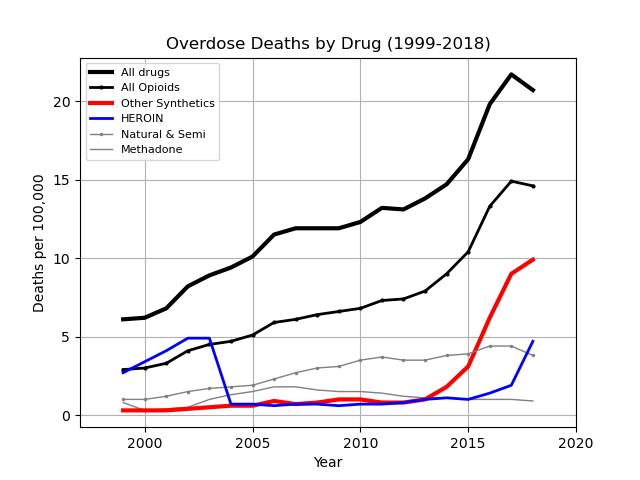

In [64]:
##Deaths by methadone, other synthetics, all opioids
#Filter core data to be analyzed (i.e. only opioid deaths, deaths per 100k - age-adjusted)
synth_df = data_df
synth_df = synth_df[synth_df["UNIT"] == "Deaths per 100,000 resident population, age-adjusted"]
synth_df = synth_df[synth_df["STUB_NAME"] == "Total"]

##Generate a line plot of Deaths per 100k vs. calendar year
##Define data to be analyzed from DF (One set each for all, each drug grouping)

# for x-axis setting
all_year= synth_df.loc[synth_df["PANEL"] == "Drug overdose deaths involving any opioid"]["YEAR"]

# data for line plots
Deaths_all_op  = synth_df[synth_df["PANEL"] == "Drug overdose deaths involving any opioid"]\
                                   ["ESTIMATE"]
Deaths_meth    = synth_df[synth_df["PANEL"] == "Drug overdose deaths involving methadone"]\
                                   ["ESTIMATE"]
Deaths_synth   = synth_df[synth_df["PANEL"] == "Drug overdose deaths involving other synthetic opioids (other than methadone)"]\
                                   ["ESTIMATE"]
Deaths_ALL     = synth_df[synth_df["PANEL"] == "All drug overdose deaths"]\
                                   ["ESTIMATE"]
Deaths_natsemi = synth_df[synth_df["PANEL"] == "Drug overdose deaths involving natural and semisynthetic opioids"]\
                                   ["ESTIMATE"]
Deaths_heroin  = synth_df[synth_df["PANEL"] == "Drug overdose deaths involving heroin"]\
                                   ["ESTIMATE"]

##Set parameters for line chart with output
fig, ax1 = plt.subplots()
plt.title("Overdose Deaths by Drug (1999-2018)", fontsize=12)
ax1.set_xlim(min(Year_all)-2, max(Year_all)+2)
ax1.set_ylabel("Deaths per 100,000")
ax1.set_xlabel("Year")
plt.grid(True)

# create line plots
all_op,    = plt.plot(all_year, Deaths_all_op, linewidth=2.0, marker="o", markersize=2, color="black", label="All Opioids")
methodone, = plt.plot(all_year, Deaths_meth, linewidth=1.0, marker="", color="gray", label="Methadone")
oth_syn,   = plt.plot(all_year, Deaths_synth, linewidth=3.0, marker="", color="red", label="Other Synthetics")
ALL_drugs, = plt.plot(all_year, Deaths_ALL, linewidth=3.0, marker="", color="black", label="All drugs")
nat_semi,  = plt.plot(all_year, Deaths_natsemi, linewidth=1.0, marker="o", markersize=1.5, color="gray", label="Natural & Semi")
heroin,    = plt.plot(all_year, Deaths_heroin, linewidth=2.0, marker="", color="blue", label="HEROIN")


# create legend
plt.legend(handles=[ALL_drugs,
                    all_op,
                    oth_syn,
                    heroin,
                    nat_semi,
                    methodone
                   ], loc="best", fontsize=8)

# save to file and output to screen
plt.savefig("output/rate_by_synth.png")
plt.show();

In [65]:
# Load the CSV file into a Pandas DataFrame and apply any filters
data_df = pd.read_csv("resources/DrugODs_Demographic.csv")

##Filter core data to be analyzed (i.e. only opioid deaths, deaths per 100k - age-adjusted)
all_df = data_df[data_df["PANEL"] == "Drug overdose deaths involving any opioid"]
all_df = all_df[all_df["UNIT"] == "Deaths per 100,000 resident population, age-adjusted"]

male_df = all_df[all_df["STUB_LABEL"] == "Male"]
female_df = all_df[all_df["STUB_LABEL"] == "Female"]
all_df = all_df[all_df["STUB_LABEL"] == "All persons"]

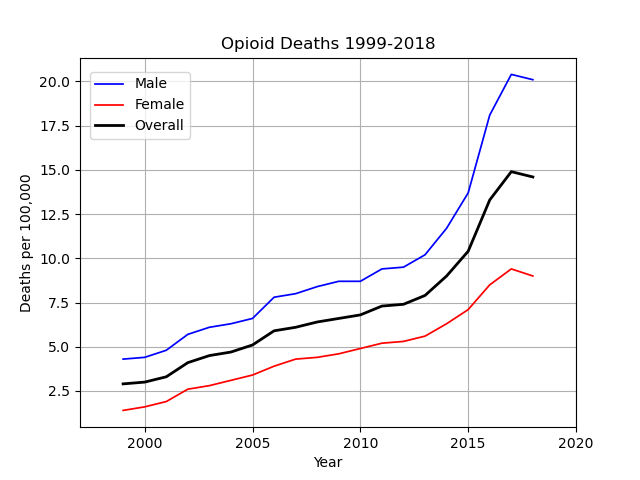

In [66]:
# Generate a line plot of Deaths per 100k vs. calendar year

##Define data to be analyzed from DF (One set each for all, male, female)
Year_all = all_df.loc[:,"YEAR"]

Deaths_all = all_df.loc[:,"ESTIMATE"]
Deaths_male = male_df.loc[:,"ESTIMATE"]
Deaths_female = female_df.loc[:,"ESTIMATE"]

##Set parameters and variables to be plotted on a line chart with output
fig, ax1 = plt.subplots()
plt.title("Opioid Deaths 1999-2018", fontsize=12)
ax1.set_xlim(min(Year_all)-2, max(Year_all)+2)

ax1.set_ylabel("Deaths per 100,000")
ax1.set_xlabel("Year")
plt.grid(True)

all, = plt.plot(Year_all, Deaths_all, linewidth=2.0, marker="", color="black", label="Overall")
male, = plt.plot(Year_all, Deaths_male, linewidth=1.25, marker="", color="blue", label="Male")
female, = plt.plot(Year_all, Deaths_female, linewidth=1.25, marker="", color="red", label="Female")

plt.legend(handles=[male, female, all], loc=(0.02,.78))

plt.show();

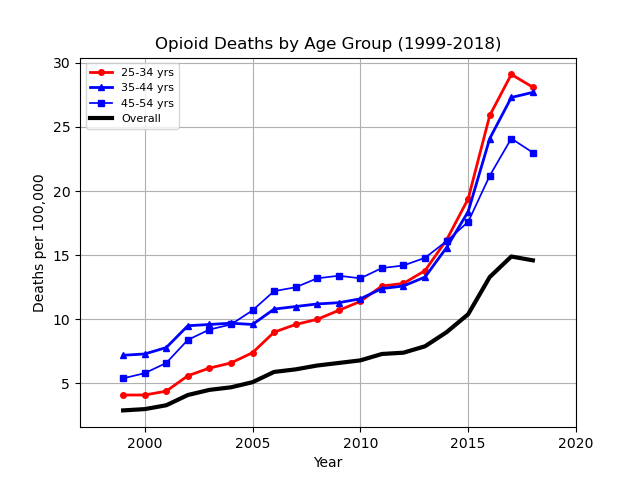

In [67]:
##Create deaths by age grouping chart
##Filter core data to be analyzed (i.e. only opioid deaths, deaths per 100k - age-adjusted)
age_df = data_df[data_df["PANEL"] == "Drug overdose deaths involving any opioid"]
age_df = age_df[age_df["STUB_NAME"] == "Age"]

##Separate each age group into separate DFs
under_15_df     = age_df[age_df["STUB_LABEL"] == "Under 15 years"]
age_15_24_df    = age_df[age_df["STUB_LABEL"] == "15-24 years"]
age_25_34_df    = age_df[age_df["STUB_LABEL"] == "25-34 years"]
age_35_44_df    = age_df[age_df["STUB_LABEL"] == "35-44 years"]
age_45_54_df    = age_df[age_df["STUB_LABEL"] == "45-54 years"]
age_55_64_df    = age_df[age_df["STUB_LABEL"] == "55-64 years"]
age_65_74_df    = age_df[age_df["STUB_LABEL"] == "65-74 years"]
age_75_84_df    = age_df[age_df["STUB_LABEL"] == "75-84 years"]
inc_n_ovr_85_df = age_df[age_df["STUB_LABEL"] == "85 years and over"]

# Generate a line plot of Deaths per 100k vs. calendar year
##Define data to be analyzed from DF (One set each for all, each age group)
Year_all = all_df.loc[:,"YEAR"]

Deaths_all      =          all_df.loc[:,"ESTIMATE"]
Deaths_und15    =     under_15_df.loc[:,"ESTIMATE"]
Deaths_15_24    =    age_15_24_df.loc[:,"ESTIMATE"]
Deaths_25_34    =    age_25_34_df.loc[:,"ESTIMATE"]
Deaths_35_44    =    age_35_44_df.loc[:,"ESTIMATE"]
Deaths_45_54    =    age_45_54_df.loc[:,"ESTIMATE"]
Deaths_55_64    =    age_55_64_df.loc[:,"ESTIMATE"]
Deaths_65_74    =    age_65_74_df.loc[:,"ESTIMATE"]
Deaths_75_84    =    age_75_84_df.loc[:,"ESTIMATE"]
Deaths_85_n_ovr = inc_n_ovr_85_df.loc[:,"ESTIMATE"]

##Set parameters and variables to be plotted on a line chart with output
fig, ax1 = plt.subplots()
plt.title("Opioid Deaths by Age Group (1999-2018)", fontsize=12)
ax1.set_xlim(min(Year_all)-2, max(Year_all)+2)
ax1.set_ylabel("Deaths per 100,000")
ax1.set_xlabel("Year")
plt.grid(True)

##Set up of line plots
##Commented out lines below in order to focus plot output on age groups with higher death rates.
all,      = plt.plot(Year_all, Deaths_all, linewidth=3.0, marker="", color="black", label="Overall")
##age_un15,  = plt.plot(Year_all, Deaths_und15, linewidth=0.50, marker="", label="Under 15")
##age_15_24, = plt.plot(Year_all, Deaths_15_24, linewidth=0.50, marker="", label="15-24")
age_25_34, = plt.plot(Year_all, Deaths_25_34, linewidth=2.00, marker="o", markersize=4, color="red", label="25-34 yrs")
age_35_44, = plt.plot(Year_all, Deaths_35_44, linewidth=2.00, marker="^", markersize=4, color="blue", label="35-44 yrs")
age_45_54, = plt.plot(Year_all, Deaths_45_54, linewidth=1.25, marker="s", markersize=4, color="blue", label="45-54 yrs")
##age_55_64, = plt.plot(Year_all, Deaths_55_64, linewidth=1.25, marker="", label="55-64")
##age_65_74, = plt.plot(Year_all, Deaths_65_74, linewidth=0.50, marker="", label="65-74")
##age_75_84, = plt.plot(Year_all, Deaths_75_84, linewidth=0.50, marker="", label="75-84")
##age_85ovr, = plt.plot(Year_all, Deaths_85_n_ovr, linewidth=0.50, marker="", label="85 & Over")

plt.legend(handles=[
##                    age_un15,
##                    age_15_24,
                    age_25_34,
                    age_35_44,
                    age_45_54,
##                    age_55_64,
##                    age_65_74,
##                    age_75_84,
##                    age_85ovr,
                    all],
           loc="best", fontsize=8)

#Output to file and screen
plt.savefig("output/rate_by_age.png")
plt.show();

# Is the opioid crisis region/state specific? (AW)

In [68]:
drug_df = pd.DataFrame(drug_overdose_data)
drug_df.head()

,ï»¿State,State Abbreviation,2019 Age-adjusted Rate (per 100000 population),2019 Number of Deaths,2018 Age-adjusted Rate (per 100000 population),2018 Number of Deaths,2017 Age-adjusted Rate (per 100000 population),2017 Number of Deaths,2016 Age-adjusted Rate (per 100000 population),2016 Number of Deaths,...,2013 Age-adjusted Rate (per 100000 population),2013 Number of Deaths,2019 Poverty rate (percent of persons in poverty),Gini coefficient of income inequality,GDP per capita 2021,GDP (nominal in millions of USD) 2021,Urban population as a percentage of the total population in 2010,Population density per kmÂ²,Population,"Land Area (kmÂ²)"""
0,Alabama,AL,16.3,768,16.6,775,18.0,835.0,16.2,756.0,...,12.7,598,15.5,0.4847,48475,243555,59.0,37.043399,4858979,131169.9
1,Alaska,AK,17.8,132,14.6,110,20.2,147.0,16.8,128.0,...,14.4,105,10.1,0.4081,69336,54020,66.0,0.499631,738432,1477953.4
2,Arizona,AZ,26.8,1907,23.8,1670,22.2,1532.0,20.3,1382.0,...,18.7,1222,13.5,0.4713,55954,400156,89.8,23.208362,6828065,294207.1
3,Arkansas,AR,13.5,388,15.7,444,15.5,446.0,14.0,401.0,...,11.1,319,16.2,0.4719,47629,143438,56.2,22.098420,2978204,134770.0
4,California,CA,15.0,6198,12.8,5348,11.7,4868.0,11.2,4654.0,...,11.1,4452,11.8,0.4899,83213,3290170,95.0,96.909425,39144818,403932.0


In [69]:
del drug_df['ï»¿State']
drug_df.head()

,State Abbreviation,2019 Age-adjusted Rate (per 100000 population),2019 Number of Deaths,2018 Age-adjusted Rate (per 100000 population),2018 Number of Deaths,2017 Age-adjusted Rate (per 100000 population),2017 Number of Deaths,2016 Age-adjusted Rate (per 100000 population),2016 Number of Deaths,2015 Age-adjusted Rate (per 100000 population),...,2013 Age-adjusted Rate (per 100000 population),2013 Number of Deaths,2019 Poverty rate (percent of persons in poverty),Gini coefficient of income inequality,GDP per capita 2021,GDP (nominal in millions of USD) 2021,Urban population as a percentage of the total population in 2010,Population density per kmÂ²,Population,"Land Area (kmÂ²)"""
0,AL,16.3,768,16.6,775,18.0,835.0,16.2,756.0,15.7,...,12.7,598,15.5,0.4847,48475,243555,59.0,37.043399,4858979,131169.9
1,AK,17.8,132,14.6,110,20.2,147.0,16.8,128.0,16.0,...,14.4,105,10.1,0.4081,69336,54020,66.0,0.499631,738432,1477953.4
2,AZ,26.8,1907,23.8,1670,22.2,1532.0,20.3,1382.0,19.0,...,18.7,1222,13.5,0.4713,55954,400156,89.8,23.208362,6828065,294207.1
3,AR,13.5,388,15.7,444,15.5,446.0,14.0,401.0,13.8,...,11.1,319,16.2,0.4719,47629,143438,56.2,22.098420,2978204,134770.0
4,CA,15.0,6198,12.8,5348,11.7,4868.0,11.2,4654.0,11.3,...,11.1,4452,11.8,0.4899,83213,3290170,95.0,96.909425,39144818,403932.0


In [70]:
drug_df.count()

State Abbreviation                                                  51
2019 Age-adjusted Rate (per 100000 population)                      51
2019 Number of Deaths                                               51
2018 Age-adjusted Rate (per 100000 population)                      51
2018 Number of Deaths                                               51
2017 Age-adjusted Rate (per 100000 population)                      50
2017 Number of Deaths                                               50
2016 Age-adjusted Rate (per 100000 population)                      50
2016 Number of Deaths                                               50
2015 Age-adjusted Rate (per 100000 population)                      50
2015 Number of Deaths                                               50
2014 Age-adjusted Rate (per 100000 population)                      51
2014 Number of Deaths                                               51
2013 Age-adjusted Rate (per 100000 population)                      51
2013 N

In [71]:
drug_df.isnull().sum()

State Abbreviation                                                  0
2019 Age-adjusted Rate (per 100000 population)                      0
2019 Number of Deaths                                               0
2018 Age-adjusted Rate (per 100000 population)                      0
2018 Number of Deaths                                               0
2017 Age-adjusted Rate (per 100000 population)                      1
2017 Number of Deaths                                               1
2016 Age-adjusted Rate (per 100000 population)                      1
2016 Number of Deaths                                               1
2015 Age-adjusted Rate (per 100000 population)                      1
2015 Number of Deaths                                               1
2014 Age-adjusted Rate (per 100000 population)                      0
2014 Number of Deaths                                               0
2013 Age-adjusted Rate (per 100000 population)                      0
2013 Number of Death

In [72]:
drug_df.rename(columns={"State Abbreviation": "State"},inplace=True)
drug_df.head()

,State,2019 Age-adjusted Rate (per 100000 population),2019 Number of Deaths,2018 Age-adjusted Rate (per 100000 population),2018 Number of Deaths,2017 Age-adjusted Rate (per 100000 population),2017 Number of Deaths,2016 Age-adjusted Rate (per 100000 population),2016 Number of Deaths,2015 Age-adjusted Rate (per 100000 population),...,2013 Age-adjusted Rate (per 100000 population),2013 Number of Deaths,2019 Poverty rate (percent of persons in poverty),Gini coefficient of income inequality,GDP per capita 2021,GDP (nominal in millions of USD) 2021,Urban population as a percentage of the total population in 2010,Population density per kmÂ²,Population,"Land Area (kmÂ²)"""
0,AL,16.3,768,16.6,775,18.0,835.0,16.2,756.0,15.7,...,12.7,598,15.5,0.4847,48475,243555,59.0,37.043399,4858979,131169.9
1,AK,17.8,132,14.6,110,20.2,147.0,16.8,128.0,16.0,...,14.4,105,10.1,0.4081,69336,54020,66.0,0.499631,738432,1477953.4
2,AZ,26.8,1907,23.8,1670,22.2,1532.0,20.3,1382.0,19.0,...,18.7,1222,13.5,0.4713,55954,400156,89.8,23.208362,6828065,294207.1
3,AR,13.5,388,15.7,444,15.5,446.0,14.0,401.0,13.8,...,11.1,319,16.2,0.4719,47629,143438,56.2,22.098420,2978204,134770.0
4,CA,15.0,6198,12.8,5348,11.7,4868.0,11.2,4654.0,11.3,...,11.1,4452,11.8,0.4899,83213,3290170,95.0,96.909425,39144818,403932.0


In [73]:
#Cleaning data by renaming columns
drug_df.rename(columns={'2019 Age-adjusted Rate (per 100000 population)': '2019 OD Rate',
                        '2018 Age-adjusted Rate (per 100000 population)': '2018 OD Rate',
                        '2017 Age-adjusted Rate (per 100000 population)': '2017 OD Rate',
                        '2016 Age-adjusted Rate (per 100000 population)': '2016 OD Rate',
                        '2015 Age-adjusted Rate (per 100000 population)': '2015 OD Rate',
                        '2014 Age-adjusted Rate (per 100000 population)': '2014 OD Rate',
                        '2013 Age-adjusted Rate (per 100000 population)': '2013 OD Rate'},inplace=True)
drug_df.head(10)

,State,2019 OD Rate,2019 Number of Deaths,2018 OD Rate,2018 Number of Deaths,2017 OD Rate,2017 Number of Deaths,2016 OD Rate,2016 Number of Deaths,2015 OD Rate,...,2013 OD Rate,2013 Number of Deaths,2019 Poverty rate (percent of persons in poverty),Gini coefficient of income inequality,GDP per capita 2021,GDP (nominal in millions of USD) 2021,Urban population as a percentage of the total population in 2010,Population density per kmÂ²,Population,"Land Area (kmÂ²)"""
0,AL,16.3,768,16.6,775,18.0,835.0,16.2,756.0,15.7,...,12.7,598,15.5,0.4847,48475,243555,59.0,37.043399,4858979,131169.9
1,AK,17.8,132,14.6,110,20.2,147.0,16.8,128.0,16.0,...,14.4,105,10.1,0.4081,69336,54020,66.0,0.499631,738432,1477953.4
2,AZ,26.8,1907,23.8,1670,22.2,1532.0,20.3,1382.0,19.0,...,18.7,1222,13.5,0.4713,55954,400156,89.8,23.208362,6828065,294207.1
3,AR,13.5,388,15.7,444,15.5,446.0,14.0,401.0,13.8,...,11.1,319,16.2,0.4719,47629,143438,56.2,22.098420,2978204,134770.0
4,CA,15.0,6198,12.8,5348,11.7,4868.0,11.2,4654.0,11.3,...,11.1,4452,11.8,0.4899,83213,3290170,95.0,96.909425,39144818,403932.0
5,CO,18.0,1079,16.8,995,17.6,1015.0,16.6,942.0,15.4,...,15.5,846,9.3,0.4586,72212,416937,86.2,20.327622,5456574,268431.5
6,CT,34.7,1214,30.7,1069,30.9,1072.0,27.4,971.0,22.1,...,16.0,582,10.0,0.4945,81712,294649,88.0,286.338562,3590886,12540.7
7,DE,48.0,435,43.8,401,37.0,338.0,30.8,282.0,22.0,...,18.7,166,11.3,0.4522,80087,79282,83.3,187.391589,945934,5047.9
8,DC,43.2,311,35.4,254,NaN,NaN,NaN,NaN,NaN,...,15.0,102,13.5,0.5420,219550,151390,100.0,4254.607595,672228,158.0
9,FL,25.5,5268,22.8,4698,25.1,5088.0,23.7,4728.0,16.2,...,12.6,2474,12.7,0.4852,55664,1198913,91.2,145.953987,20271272,138888.1


In [74]:
drug_df.rename(columns={"2019 Number of Deaths":'2019 Deaths',
                        "2018 Number of Deaths":'2018 Deaths',
                        "2017 Number of Deaths":'2017 Deaths',
                        "2016 Number of Deaths":'2016 Deaths',
                        "2015 Number of Deaths":'2015 Deaths',
                        "2014 Number of Deaths":'2014 Deaths',
                        "2013 Number of Deaths":'2013 Deaths',
                        "Population density per kmÂ²": "Pop Density / Sq Km",
                        'Population': "State Pop",
                        'Land Area (kmÂ²)"': "Land Area in Sq Km"
                        },inplace=True)
drug_df.head(10)

,State,2019 OD Rate,2019 Deaths,2018 OD Rate,2018 Deaths,2017 OD Rate,2017 Deaths,2016 OD Rate,2016 Deaths,2015 OD Rate,...,2013 OD Rate,2013 Deaths,2019 Poverty rate (percent of persons in poverty),Gini coefficient of income inequality,GDP per capita 2021,GDP (nominal in millions of USD) 2021,Urban population as a percentage of the total population in 2010,Pop Density / Sq Km,State Pop,Land Area in Sq Km
0,AL,16.3,768,16.6,775,18.0,835.0,16.2,756.0,15.7,...,12.7,598,15.5,0.4847,48475,243555,59.0,37.043399,4858979,131169.9
1,AK,17.8,132,14.6,110,20.2,147.0,16.8,128.0,16.0,...,14.4,105,10.1,0.4081,69336,54020,66.0,0.499631,738432,1477953.4
2,AZ,26.8,1907,23.8,1670,22.2,1532.0,20.3,1382.0,19.0,...,18.7,1222,13.5,0.4713,55954,400156,89.8,23.208362,6828065,294207.1
3,AR,13.5,388,15.7,444,15.5,446.0,14.0,401.0,13.8,...,11.1,319,16.2,0.4719,47629,143438,56.2,22.098420,2978204,134770.0
4,CA,15.0,6198,12.8,5348,11.7,4868.0,11.2,4654.0,11.3,...,11.1,4452,11.8,0.4899,83213,3290170,95.0,96.909425,39144818,403932.0
5,CO,18.0,1079,16.8,995,17.6,1015.0,16.6,942.0,15.4,...,15.5,846,9.3,0.4586,72212,416937,86.2,20.327622,5456574,268431.5
6,CT,34.7,1214,30.7,1069,30.9,1072.0,27.4,971.0,22.1,...,16.0,582,10.0,0.4945,81712,294649,88.0,286.338562,3590886,12540.7
7,DE,48.0,435,43.8,401,37.0,338.0,30.8,282.0,22.0,...,18.7,166,11.3,0.4522,80087,79282,83.3,187.391589,945934,5047.9
8,DC,43.2,311,35.4,254,NaN,NaN,NaN,NaN,NaN,...,15.0,102,13.5,0.5420,219550,151390,100.0,4254.607595,672228,158.0
9,FL,25.5,5268,22.8,4698,25.1,5088.0,23.7,4728.0,16.2,...,12.6,2474,12.7,0.4852,55664,1198913,91.2,145.953987,20271272,138888.1


In [75]:
#dropping Washington D.C. null values
clean_overdose_df = drug_df.dropna()
clean_overdose_df.head()

,State,2019 OD Rate,2019 Deaths,2018 OD Rate,2018 Deaths,2017 OD Rate,2017 Deaths,2016 OD Rate,2016 Deaths,2015 OD Rate,...,2013 OD Rate,2013 Deaths,2019 Poverty rate (percent of persons in poverty),Gini coefficient of income inequality,GDP per capita 2021,GDP (nominal in millions of USD) 2021,Urban population as a percentage of the total population in 2010,Pop Density / Sq Km,State Pop,Land Area in Sq Km
0,AL,16.3,768,16.6,775,18.0,835.0,16.2,756.0,15.7,...,12.7,598,15.5,0.4847,48475,243555,59.0,37.043399,4858979,131169.9
1,AK,17.8,132,14.6,110,20.2,147.0,16.8,128.0,16.0,...,14.4,105,10.1,0.4081,69336,54020,66.0,0.499631,738432,1477953.4
2,AZ,26.8,1907,23.8,1670,22.2,1532.0,20.3,1382.0,19.0,...,18.7,1222,13.5,0.4713,55954,400156,89.8,23.208362,6828065,294207.1
3,AR,13.5,388,15.7,444,15.5,446.0,14.0,401.0,13.8,...,11.1,319,16.2,0.4719,47629,143438,56.2,22.098420,2978204,134770.0
4,CA,15.0,6198,12.8,5348,11.7,4868.0,11.2,4654.0,11.3,...,11.1,4452,11.8,0.4899,83213,3290170,95.0,96.909425,39144818,403932.0


In [76]:
#creating table which focuses on OD rate per 100,000 people
drug_overdose_rates_df = clean_overdose_df[['State','2019 OD Rate','2018 OD Rate','2017 OD Rate','2016 OD Rate','2015 OD Rate','2014 OD Rate','2013 OD Rate']]
drug_overdose_rates_df.head(10)

,State,2019 OD Rate,2018 OD Rate,2017 OD Rate,2016 OD Rate,2015 OD Rate,2014 OD Rate,2013 OD Rate
0,AL,16.3,16.6,18.0,16.2,15.7,15.2,12.7
1,AK,17.8,14.6,20.2,16.8,16.0,16.8,14.4
2,AZ,26.8,23.8,22.2,20.3,19.0,18.2,18.7
3,AR,13.5,15.7,15.5,14.0,13.8,12.6,11.1
4,CA,15.0,12.8,11.7,11.2,11.3,11.1,11.1
5,CO,18.0,16.8,17.6,16.6,15.4,16.3,15.5
6,CT,34.7,30.7,30.9,27.4,22.1,17.6,16.0
7,DE,48.0,43.8,37.0,30.8,22.0,20.9,18.7
9,FL,25.5,22.8,25.1,23.7,16.2,13.2,12.6
10,GA,13.1,13.2,14.7,13.3,12.7,11.9,10.8


In [77]:
#setting state as index for cleaning/transposing
drug_overdose_rates_df.set_index("State",inplace=True)
drug_overdose_rates_df.rename_axis(None,axis=0,inplace=True)
print(drug_overdose_rates_df)

    2019 OD Rate  2018 OD Rate  2017 OD Rate  2016 OD Rate  2015 OD Rate  \
AL          16.3          16.6          18.0          16.2          15.7   
AK          17.8          14.6          20.2          16.8          16.0   
AZ          26.8          23.8          22.2          20.3          19.0   
AR          13.5          15.7          15.5          14.0          13.8   
CA          15.0          12.8          11.7          11.2          11.3   
CO          18.0          16.8          17.6          16.6          15.4   
CT          34.7          30.7          30.9          27.4          22.1   
DE          48.0          43.8          37.0          30.8          22.0   
FL          25.5          22.8          25.1          23.7          16.2   
GA          13.1          13.2          14.7          13.3          12.7   
HI          15.9          14.3          13.8          12.8          11.3   
ID          15.1          14.6          14.4          15.2          14.2   
IL          

In [78]:
#transposition of state data and yearly OD rate
transposed_overdose_df = drug_overdose_rates_df.transpose()
transposed_overdose_df.head()

,AL,AK,AZ,AR,CA,CO,CT,DE,FL,GA,...,SD,TN,TX,UT,VT,VA,WA,WV,WI,WY
2019 OD Rate,16.3,17.8,26.8,13.5,15.0,18.0,34.7,48.0,25.5,13.1,...,10.5,31.2,10.8,18.9,23.8,18.3,15.8,52.8,21.1,14.1
2018 OD Rate,16.6,14.6,23.8,15.7,12.8,16.8,30.7,43.8,22.8,13.2,...,6.9,27.5,10.4,21.2,26.6,17.1,14.8,51.5,19.2,11.1
2017 OD Rate,18.0,20.2,22.2,15.5,11.7,17.6,30.9,37.0,25.1,14.7,...,8.5,26.6,10.5,22.3,23.2,17.9,15.2,57.8,21.2,12.2
2016 OD Rate,16.2,16.8,20.3,14.0,11.2,16.6,27.4,30.8,23.7,13.3,...,8.4,24.5,10.1,22.4,22.2,16.7,14.5,52.0,19.3,17.6
2015 OD Rate,15.7,16.0,19.0,13.8,11.3,15.4,22.1,22.0,16.2,12.7,...,8.4,22.2,9.4,23.4,16.7,12.4,14.7,41.5,15.5,16.4


In [79]:
#reordering rows by ascending year
sorted_overdose_data = transposed_overdose_df.sort_index(ascending=True)
sorted_overdose_data.head()

,AL,AK,AZ,AR,CA,CO,CT,DE,FL,GA,...,SD,TN,TX,UT,VT,VA,WA,WV,WI,WY
2013 OD Rate,12.7,14.4,18.7,11.1,11.1,15.5,16.0,18.7,12.6,10.8,...,6.9,18.1,9.3,22.1,15.1,10.2,13.4,32.2,15.0,17.2
2014 OD Rate,15.2,16.8,18.2,12.6,11.1,16.3,17.6,20.9,13.2,11.9,...,7.8,19.5,9.7,22.4,13.9,11.7,13.3,35.5,15.1,19.4
2015 OD Rate,15.7,16.0,19.0,13.8,11.3,15.4,22.1,22.0,16.2,12.7,...,8.4,22.2,9.4,23.4,16.7,12.4,14.7,41.5,15.5,16.4
2016 OD Rate,16.2,16.8,20.3,14.0,11.2,16.6,27.4,30.8,23.7,13.3,...,8.4,24.5,10.1,22.4,22.2,16.7,14.5,52.0,19.3,17.6
2017 OD Rate,18.0,20.2,22.2,15.5,11.7,17.6,30.9,37.0,25.1,14.7,...,8.5,26.6,10.5,22.3,23.2,17.9,15.2,57.8,21.2,12.2


## Time series of OD Rate by state

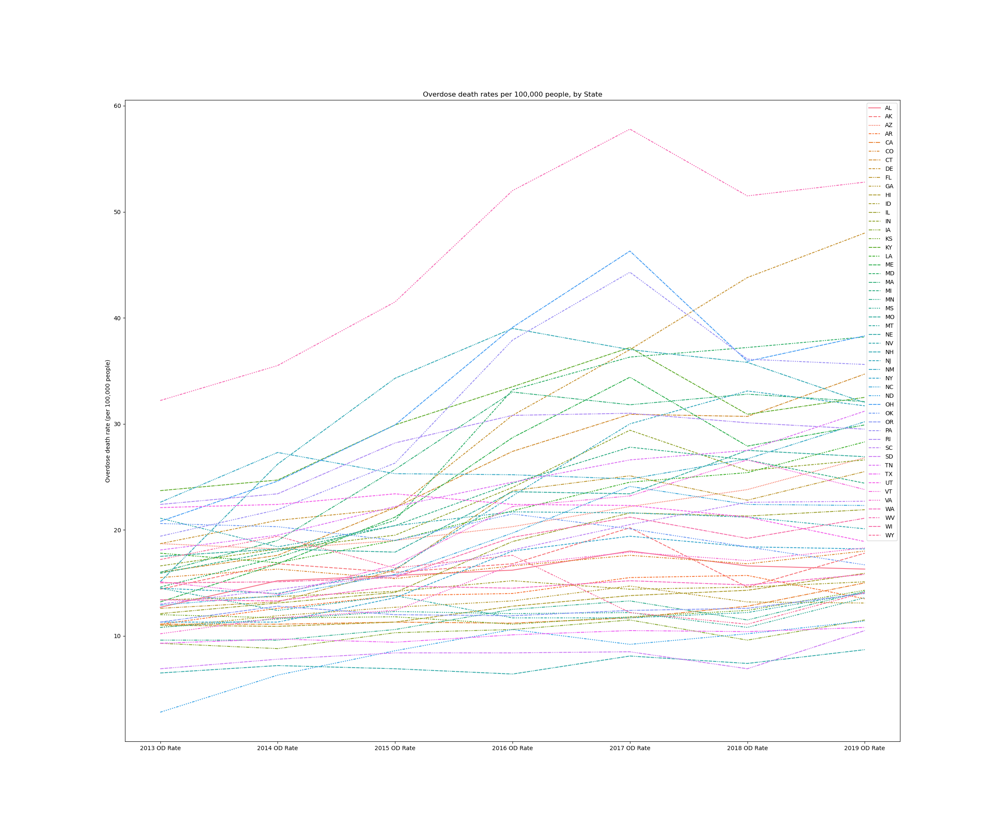

In [80]:
import warnings
warnings.filterwarnings('ignore')

#showing figure for time series of OD Rate by state
plt.figure(figsize=(24,20))
plt.title("Overdose death rates per 100,000 people, by State")
plt.ylabel("Overdose death rate (per 100,000 people)")
sns.lineplot(data=sorted_overdose_data)
plt.savefig("output/OD_Rate_by_State");

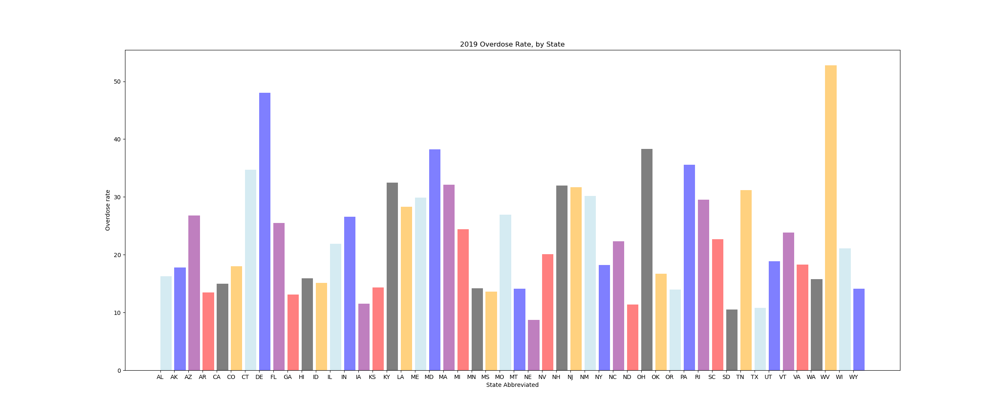

In [81]:
my_colors = ['lightblue','blue','purple','red','black','orange']

plt.figure(figsize=(24,10))
plt.title("2019 Overdose Rate, by State")
plt.ylabel("Overdose rate")
plt.xlabel("State Abbreviated")
x_axis=clean_overdose_df["State"]
y_axis=clean_overdose_df['2019 OD Rate']
plt.bar(x_axis,y_axis,color=my_colors,alpha=.5,align="edge");

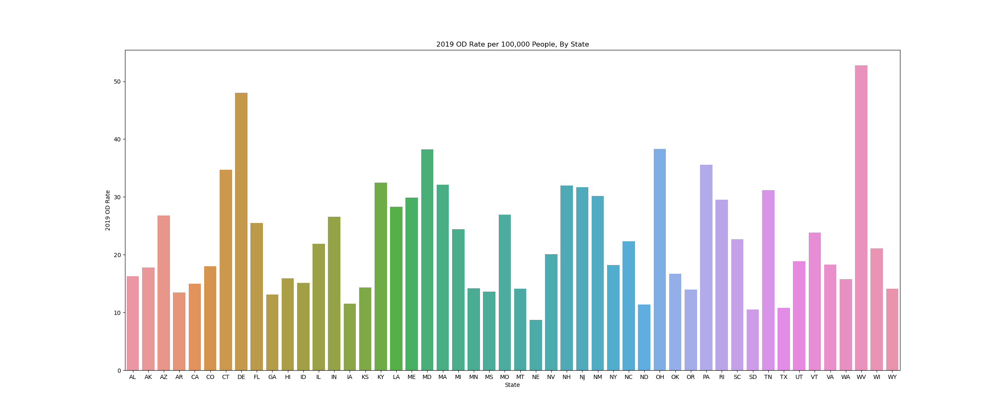

In [82]:
plt.figure(figsize=(24,10))
plt.title("2019 OD Rate per 100,000 People, By State")
sns.barplot(x=clean_overdose_df["State"],y=clean_overdose_df['2019 OD Rate'])
plt.savefig("output/2019_Rates.png");

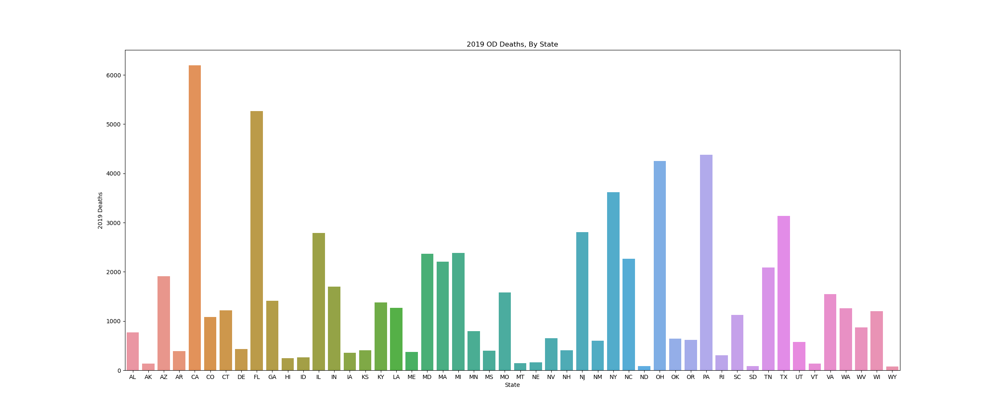

In [83]:
#showing deaths by state in bar chart
plt.figure(figsize=(24,10))
plt.title("2019 OD Deaths, By State")
sns.barplot(x=clean_overdose_df["State"],y=clean_overdose_df['2019 Deaths'])
plt.savefig("output/2019_Deaths.png");

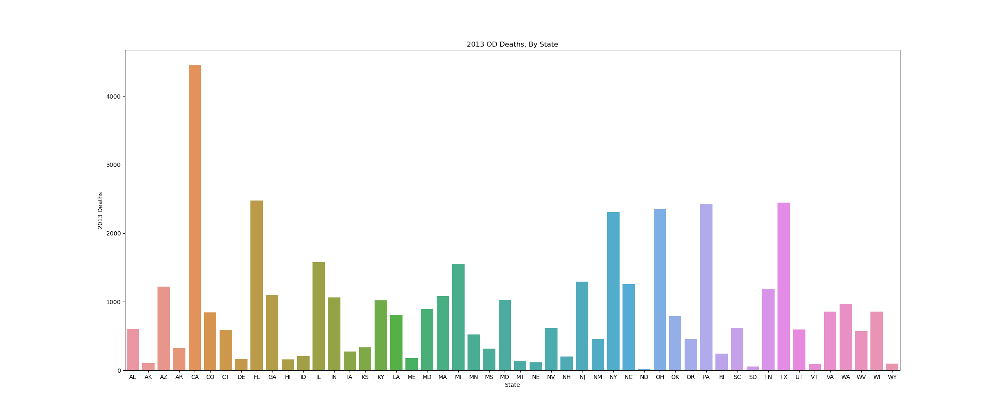

In [84]:
plt.figure(figsize=(24,10))
plt.title("2013 OD Deaths, By State")
sns.barplot(x=clean_overdose_df["State"],y=clean_overdose_df['2013 Deaths']);

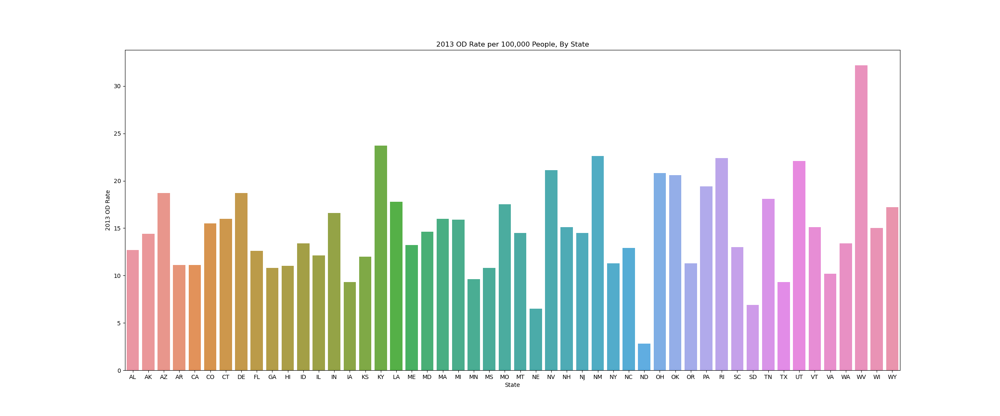

In [85]:
plt.figure(figsize=(24,10))
plt.title("2013 OD Rate per 100,000 People, By State")
sns.barplot(x=clean_overdose_df["State"],y=clean_overdose_df['2013 OD Rate'])
plt.savefig("output/2013_Deaths.png");

In [86]:

clean_overdose_df.rename(columns={
    'Urban population as a percentage of the total population in 2010': 'Urban population % 2010',
    '2019 Poverty rate (percent of persons in poverty)': '2019 Poverty %',
    'Gini coefficient of income inequality': 'Gini coefficient',
    'Pop Density / sq km': 'Pop Density / km²'
},inplace=True)

## Heatmap: Urban population as a percentage of the total population in 2010

In [87]:
heatmap_overdose = clean_overdose_df[['2019 OD Rate', '2018 OD Rate', '2017 OD Rate', '2016 OD Rate', '2015 OD Rate', '2014 OD Rate',
                                      '2013 OD Rate', '2019 Poverty %', 'Gini coefficient', 'GDP per capita 2021', 
                                    'Urban population % 2010', 'Pop Density / Sq Km']]
heatmap_overdose.head()

,2019 OD Rate,2018 OD Rate,2017 OD Rate,2016 OD Rate,2015 OD Rate,2014 OD Rate,2013 OD Rate,2019 Poverty %,Gini coefficient,GDP per capita 2021,Urban population % 2010,Pop Density / Sq Km
0,16.3,16.6,18.0,16.2,15.7,15.2,12.7,15.5,0.4847,48475,59.0,37.043399
1,17.8,14.6,20.2,16.8,16.0,16.8,14.4,10.1,0.4081,69336,66.0,0.499631
2,26.8,23.8,22.2,20.3,19.0,18.2,18.7,13.5,0.4713,55954,89.8,23.208362
3,13.5,15.7,15.5,14.0,13.8,12.6,11.1,16.2,0.4719,47629,56.2,22.098420
4,15.0,12.8,11.7,11.2,11.3,11.1,11.1,11.8,0.4899,83213,95.0,96.909425


In [88]:
heatmap_overdose.rename(columns={
    'Urban population as a percentage of the total population in 2010': 'Urban population % 2010',
    '2019 Poverty rate (percent of persons in poverty)': '2019 Poverty %',
    'Gini coefficient of income inequality': 'Gini coefficient',
    'Pop Density / sq km': 'Pop Density / km²'
},inplace=True)

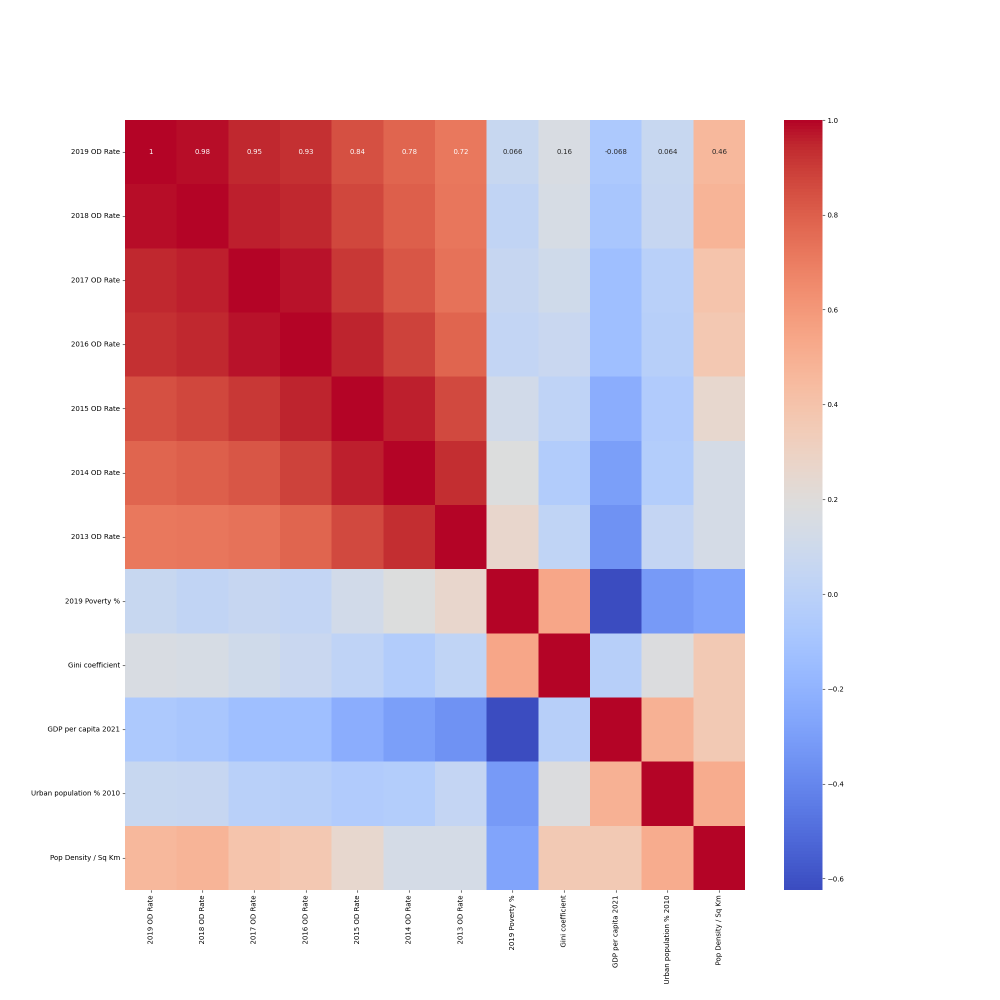

In [89]:
plt.figure(figsize=(20,20))
sns.heatmap(heatmap_overdose.corr(),cmap='coolwarm',annot=True);

In [90]:
clean_overdose_df.head()

,State,2019 OD Rate,2019 Deaths,2018 OD Rate,2018 Deaths,2017 OD Rate,2017 Deaths,2016 OD Rate,2016 Deaths,2015 OD Rate,...,2013 OD Rate,2013 Deaths,2019 Poverty %,Gini coefficient,GDP per capita 2021,GDP (nominal in millions of USD) 2021,Urban population % 2010,Pop Density / Sq Km,State Pop,Land Area in Sq Km
0,AL,16.3,768,16.6,775,18.0,835.0,16.2,756.0,15.7,...,12.7,598,15.5,0.4847,48475,243555,59.0,37.043399,4858979,131169.9
1,AK,17.8,132,14.6,110,20.2,147.0,16.8,128.0,16.0,...,14.4,105,10.1,0.4081,69336,54020,66.0,0.499631,738432,1477953.4
2,AZ,26.8,1907,23.8,1670,22.2,1532.0,20.3,1382.0,19.0,...,18.7,1222,13.5,0.4713,55954,400156,89.8,23.208362,6828065,294207.1
3,AR,13.5,388,15.7,444,15.5,446.0,14.0,401.0,13.8,...,11.1,319,16.2,0.4719,47629,143438,56.2,22.098420,2978204,134770.0
4,CA,15.0,6198,12.8,5348,11.7,4868.0,11.2,4654.0,11.3,...,11.1,4452,11.8,0.4899,83213,3290170,95.0,96.909425,39144818,403932.0


In [91]:
clean_overdose_df["State"].nunique()

50

In [92]:
clean_overdose_df.describe()

,2019 OD Rate,2019 Deaths,2018 OD Rate,2018 Deaths,2017 OD Rate,2017 Deaths,2016 OD Rate,2016 Deaths,2015 OD Rate,2015 Deaths,...,2013 OD Rate,2013 Deaths,2019 Poverty %,Gini coefficient,GDP per capita 2021,GDP (nominal in millions of USD) 2021,Urban population % 2010,Pop Density / Sq Km,State Pop,Land Area in Sq Km
count,50.00000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,50.000000,...,50.000000,50.000000,50.000000,50.000000,50.000000,5.000000e+01,50.0000,50.000000,5.000000e+01,5.000000e+01
mean,22.73800,1406.380000,21.772000,1342.260000,22.644000,1398.540000,20.964000,1267.260000,17.800000,1045.580000,...,14.868000,877.600000,12.164000,0.464648,64175.900000,4.489657e+05,73.5860,77.416425,6.414951e+06,1.829581e+05
std,9.87185,1413.381556,9.942016,1324.966304,10.731551,1425.809161,9.372077,1272.251047,6.977515,1006.145972,...,5.102878,851.120414,2.757828,0.021015,11642.349181,5.793227e+05,14.5671,102.754668,7.228727e+06,2.222711e+05
min,8.70000,79.000000,6.900000,57.000000,8.100000,68.000000,6.400000,69.000000,6.900000,61.000000,...,2.800000,20.000000,7.300000,0.406300,41796.000000,3.608900e+04,38.7000,0.499631,5.861070e+05,2.678000e+03
25%,14.47500,389.500000,13.475000,345.000000,13.950000,344.250000,13.475000,332.500000,12.925000,314.750000,...,11.300000,249.500000,10.100000,0.451975,55554.500000,9.747850e+04,65.1000,17.562608,1.857144e+06,9.515875e+04
50%,20.60000,974.500000,21.200000,925.500000,21.400000,991.000000,19.500000,881.500000,16.100000,748.500000,...,14.500000,617.000000,11.650000,0.467350,62188.500000,2.587140e+05,73.7500,40.872189,4.547908e+06,1.395784e+05
75%,29.80000,2043.500000,27.500000,1784.750000,29.000000,1833.000000,24.475000,1604.000000,21.125000,1297.750000,...,17.725000,1093.750000,13.450000,0.478900,71412.750000,5.795572e+05,86.9500,85.033414,7.084780e+06,2.103743e+05
max,52.80000,6198.000000,51.500000,5348.000000,57.800000,5388.000000,52.000000,4728.000000,41.500000,4659.000000,...,32.200000,4452.000000,20.600000,0.522900,92480.000000,3.290170e+06,95.0000,470.315906,3.914482e+07,1.477953e+06


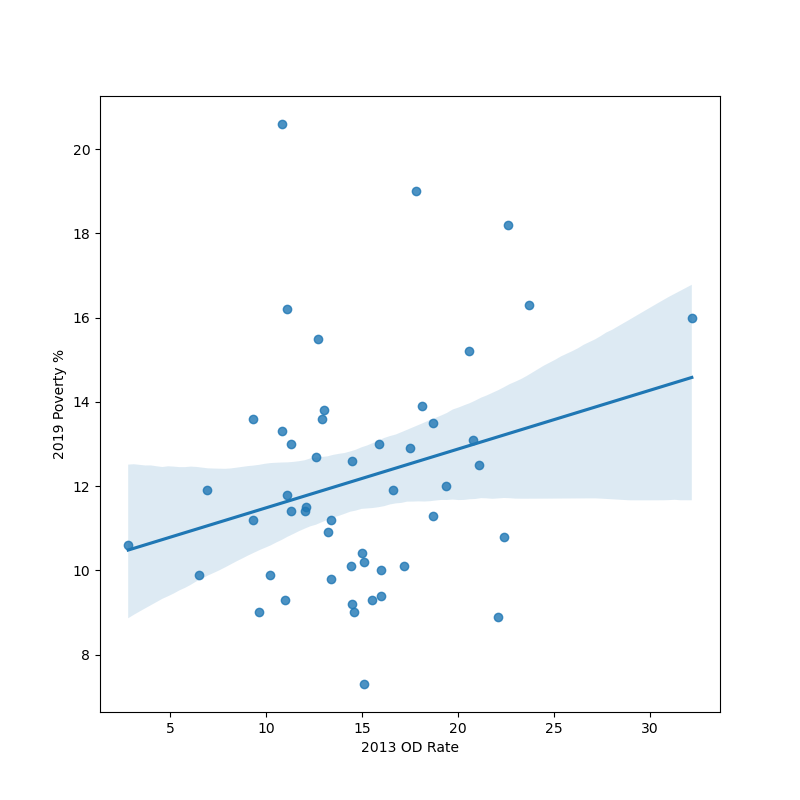

In [93]:
plt.figure(figsize=(8,8))
sns.regplot(x=heatmap_overdose["2013 OD Rate"],y=heatmap_overdose['2019 Poverty %']);

In [94]:
heatmap_overdose.corr().style.background_gradient(cmap="coolwarm")

,2019 OD Rate,2018 OD Rate,2017 OD Rate,2016 OD Rate,2015 OD Rate,2014 OD Rate,2013 OD Rate,2019 Poverty %,Gini coefficient,GDP per capita 2021,Urban population % 2010,Pop Density / Sq Km
2019 OD Rate,1.000000,0.981574,0.946576,0.925642,0.843709,0.783969,0.716911,0.065845,0.158578,-0.068021,0.063633,0.457467
2018 OD Rate,0.981574,1.000000,0.960245,0.948915,0.869974,0.798434,0.725571,0.032341,0.144908,-0.086735,0.058780,0.476995
2017 OD Rate,0.946576,0.960245,1.000000,0.978459,0.905920,0.824483,0.739082,0.056206,0.108026,-0.133947,-0.013801,0.392146
2016 OD Rate,0.925642,0.948915,0.978459,1.000000,0.953205,0.879699,0.778335,0.037360,0.072191,-0.132935,-0.018582,0.369097
2015 OD Rate,0.843709,0.869974,0.905920,0.953205,1.000000,0.957436,0.863467,0.116322,0.021884,-0.225156,-0.052951,0.253927
2014 OD Rate,0.783969,0.798434,0.824483,0.879699,0.957436,1.000000,0.933130,0.187715,-0.044385,-0.296939,-0.035018,0.134982
2013 OD Rate,0.716911,0.725571,0.739082,0.778335,0.863467,0.933130,1.000000,0.258005,0.026696,-0.352661,0.046507,0.131486
2019 Poverty %,0.065845,0.032341,0.056206,0.037360,0.116322,0.187715,0.258005,1.000000,0.537004,-0.624090,-0.313418,-0.270785
Gini coefficient,0.158578,0.144908,0.108026,0.072191,0.021884,-0.044385,0.026696,0.537004,1.000000,-0.018053,0.178362,0.359816
GDP per capita 2021,-0.068021,-0.086735,-0.133947,-0.132935,-0.225156,-0.296939,-0.352661,-0.624090,-0.018053,1.000000,0.491084,0.359521


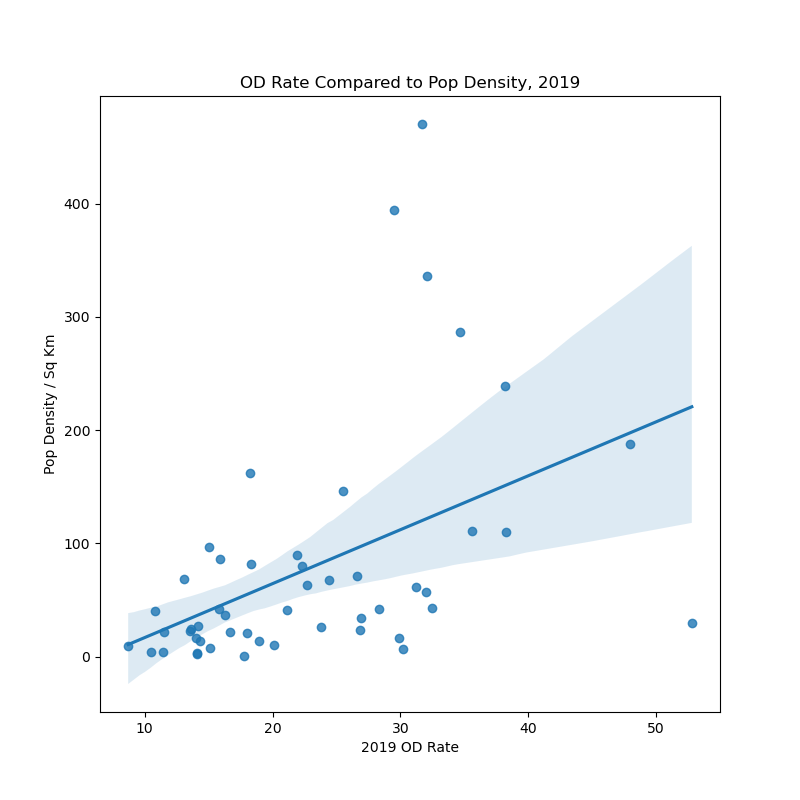

In [95]:
plt.figure(figsize=(8,8))
plt.title("OD Rate Compared to Pop Density, 2019")
sns.regplot(x=heatmap_overdose['2019 OD Rate'],y=heatmap_overdose["Pop Density / Sq Km"])
plt.savefig("output/Pop_density2019.png");

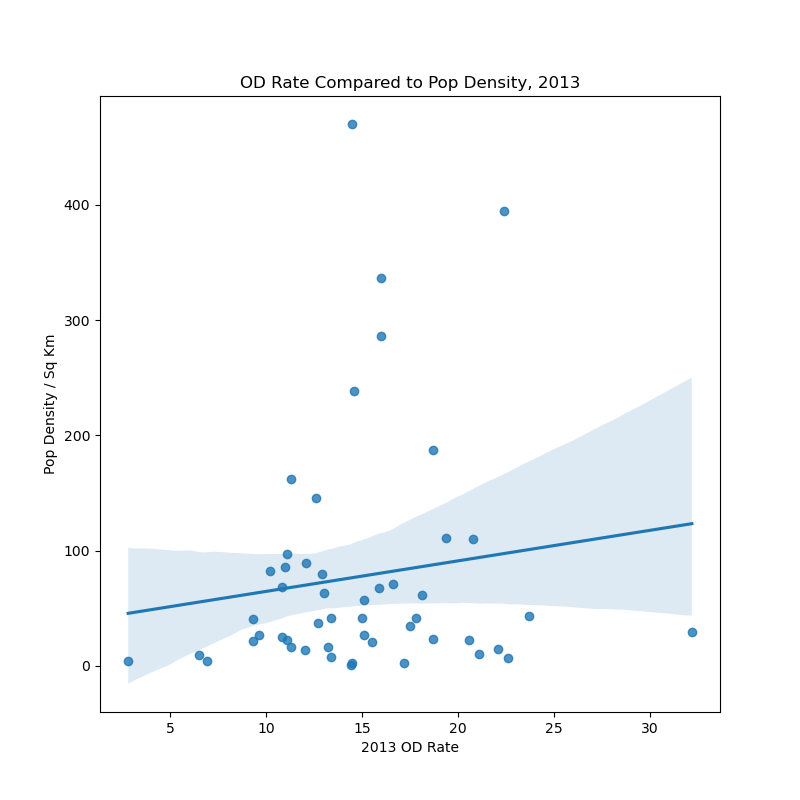

In [96]:
plt.figure(figsize=(8,8))
plt.title("OD Rate Compared to Pop Density, 2013")
sns.regplot(x=heatmap_overdose['2013 OD Rate'],y=heatmap_overdose["Pop Density / Sq Km"])
plt.savefig("output/Pop_density2013.png");

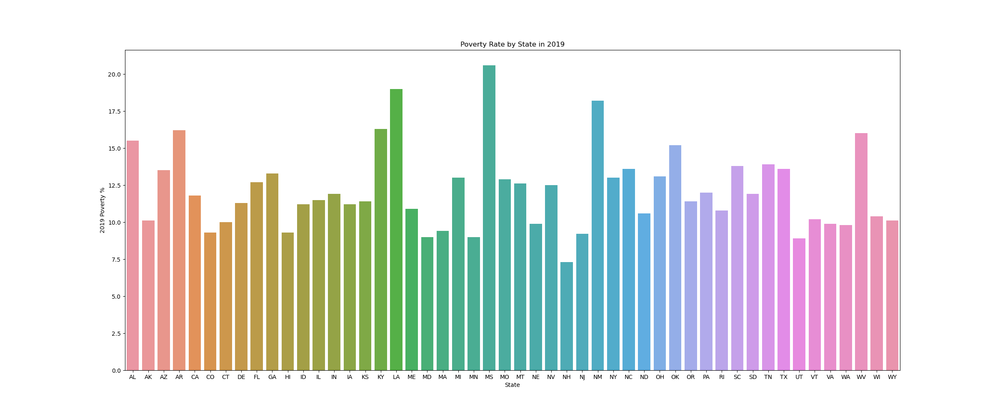

In [97]:
plt.figure(figsize=(24,10))
plt.title("Poverty Rate by State in 2019")
sns.barplot(x=clean_overdose_df['State'],y=clean_overdose_df['2019 Poverty %'])
plt.savefig("output/Poverty_rate.png");

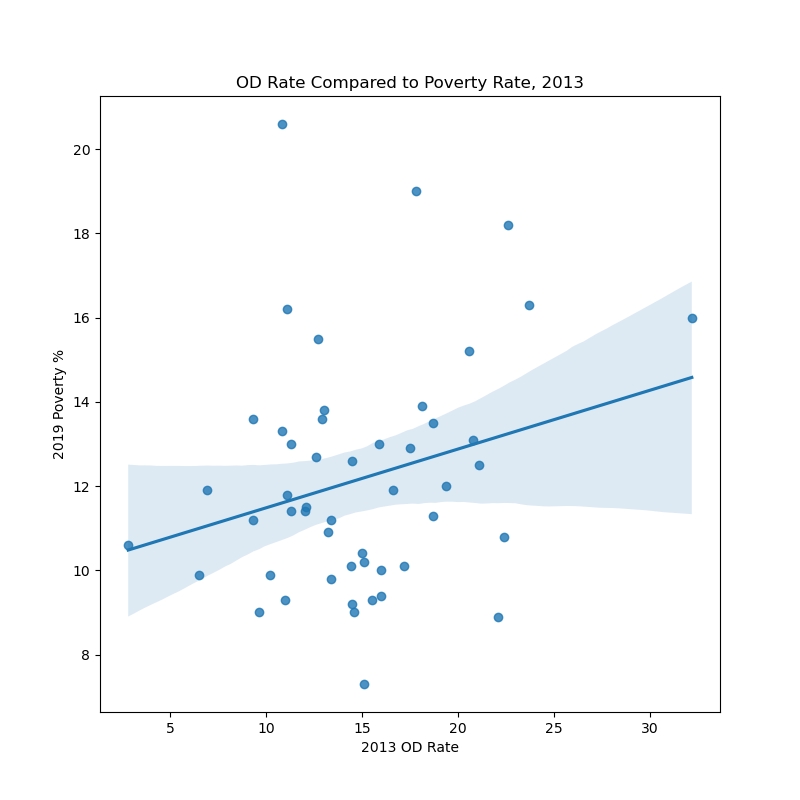

In [98]:
plt.figure(figsize=(8,8))
plt.title("OD Rate Compared to Poverty Rate, 2013")
sns.regplot(x=heatmap_overdose['2013 OD Rate'],y=heatmap_overdose["2019 Poverty %"]);

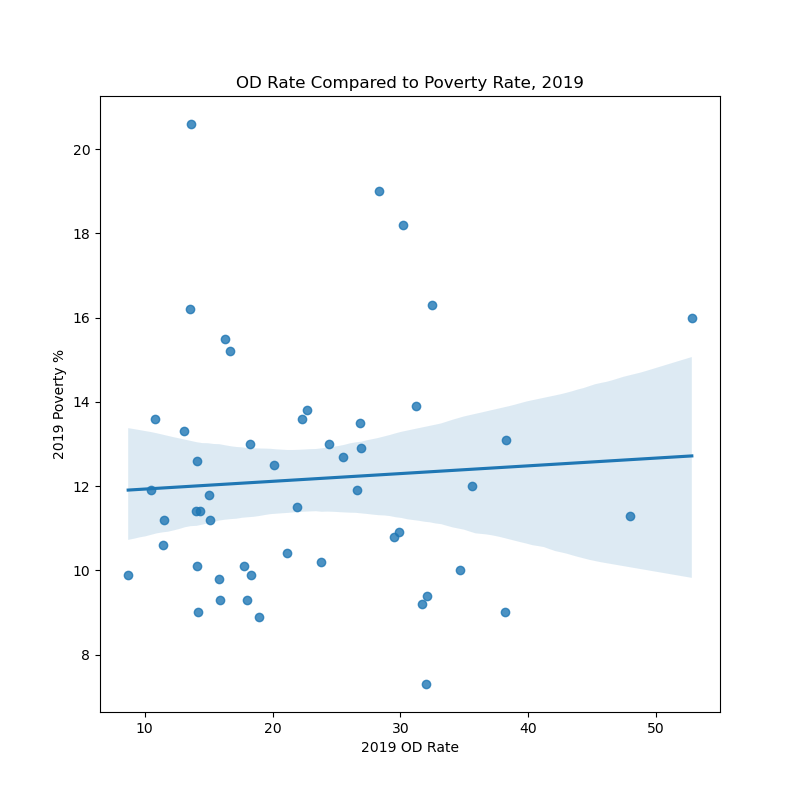

In [99]:
plt.figure(figsize=(8,8))
plt.title("OD Rate Compared to Poverty Rate, 2019")
sns.regplot(x=heatmap_overdose['2019 OD Rate'],y=heatmap_overdose["2019 Poverty %"]);

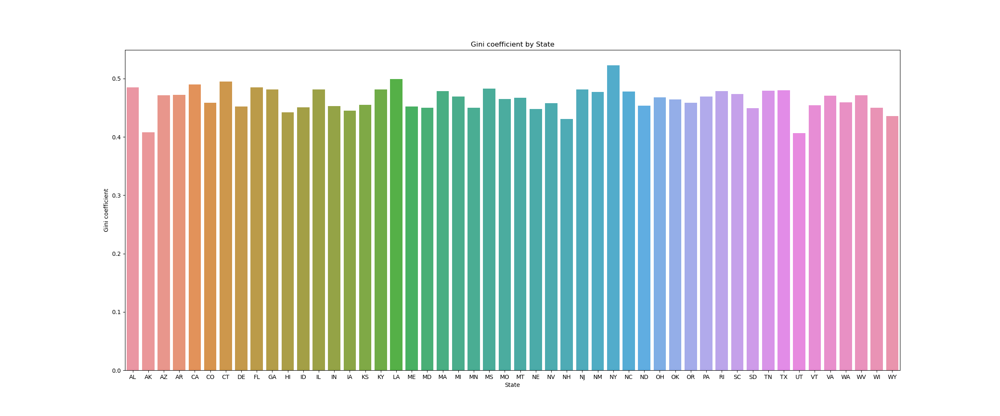

In [100]:
plt.figure(figsize=(24,10))
plt.title("Gini coefficient by State")
sns.barplot(x=clean_overdose_df['State'],y=heatmap_overdose['Gini coefficient']);

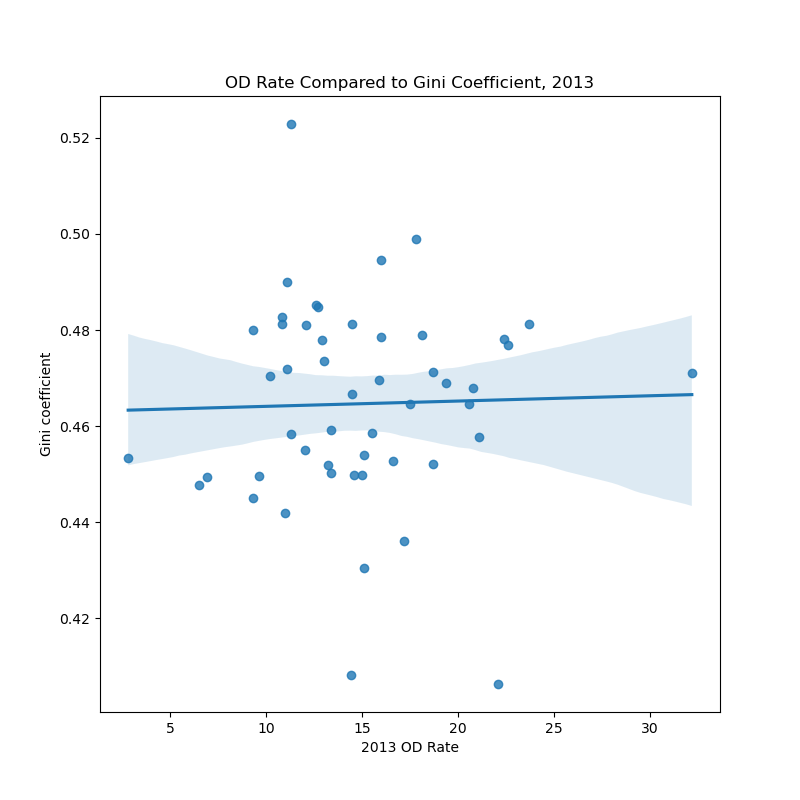

In [101]:
#regressing Gini coefficient of inequality to OD Rate in 2013 and 2019
plt.figure(figsize=(8,8))
plt.title("OD Rate Compared to Gini Coefficient, 2013")
sns.regplot(x=heatmap_overdose['2013 OD Rate'],y=heatmap_overdose["Gini coefficient"]);

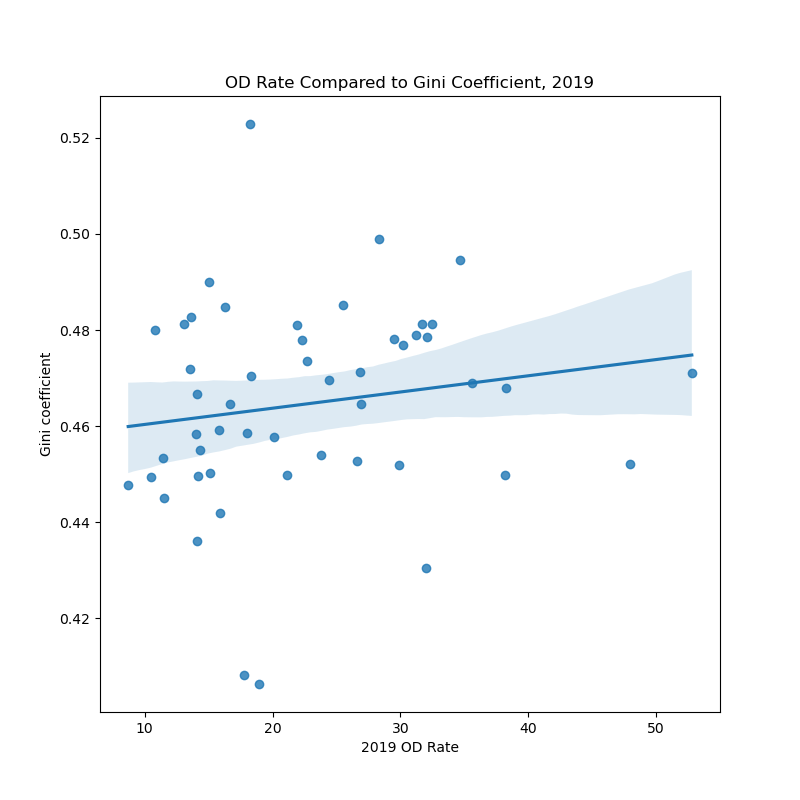

In [102]:
plt.figure(figsize=(8,8))
plt.title("OD Rate Compared to Gini Coefficient, 2019")
sns.regplot(x=heatmap_overdose['2019 OD Rate'],y=heatmap_overdose["Gini coefficient"]);